# Preprocessing

In [440]:
print(1)

1


In [1]:
from tensorflow.python.client import device_lib

print(device_lib.list_local_devices())

2023-10-20 03:45:24.096197: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1


[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 18389403528893840759
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 8786231951042960963
physical_device_desc: "device: XLA_CPU device"
, name: "/device:XLA_GPU:0"
device_type: "XLA_GPU"
memory_limit: 17179869184
locality {
}
incarnation: 10616891703188351402
physical_device_desc: "device: XLA_GPU device"
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 851050496
locality {
  bus_id: 2
  numa_node: 1
  links {
  }
}
incarnation: 17467843714226664976
physical_device_desc: "device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:d8:00.0, compute capability: 7.0"
]


2023-10-20 03:45:25.153156: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN)to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-20 03:45:25.165837: I tensorflow/core/platform/profile_utils/cpu_utils.cc:104] CPU Frequency: 3000000000 Hz
2023-10-20 03:45:25.172062: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x564044f35e40 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2023-10-20 03:45:25.172091: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2023-10-20 03:45:25.175097: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2023-10-20 03:45:25.337686: I tensorflow/compiler/xla/service/service.cc

In [5]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

In [24]:
print(np.__version__ < "1.20.0")

True


In [3]:
class BlockingTimeSeriesSplit():
    def __init__(self, n_splits):
        self.n_splits = n_splits
    
    def get_n_splits(self, groups):
        return self.n_splits
    
    def split(self, X, y=None, groups=None):
        n_samples = len(X)
        k_fold_size = n_samples // self.n_splits
        indices = np.arange(n_samples)

        margin = 0
        for i in range(self.n_splits):
            start = i * k_fold_size
            stop = start + k_fold_size
            mid = int(0.8 * (stop - start)) + start
            yield indices[start: mid], indices[mid + margin: stop]

In [4]:
class minmax():
    def __init__(self):
        pass
        
    def minmax_transform_fit(self, train_df, valid_df):

        scaler = MinMaxScaler()
        scaler = scaler.fit(train_df)

        train_scaled = scaler.transform(train_df)
        train_scaled = pd.DataFrame(train_scaled)

        valid_scaled = scaler.transform(valid_df)
        valid_scaled = pd.DataFrame(valid_scaled)

        return scaler, train_scaled, valid_scaled
    
    def minmax_transform(self, scaler, test_df):
        
        test_scaled = scaler.transform(test_df)
        test_scaled = pd.DataFrame(test_scaled)

        return test_scaled
    
    def inverse_minmax(self, scaler, df):
        return scaler.inverse_transform(df)

In [6]:
class myPCA():
    def __init__(self):
        pass

    def PCA_transform_fit(self, train_df, valid_df):
        n = len(train_df.columns)
        self.pca = PCA(n_components = n)
        pca_train = self.pca.fit_transform(train_df)
        self.pca_train_df = pd.DataFrame(pca_train, columns = [f"pca{num + 1}" for num in range(n)])

        eig = self.pca.explained_variance_
        ratio = self.pca.explained_variance_ratio_
        acc_ratio = ratio.cumsum()

        self.pca_info = pd.DataFrame({
            "eig for variance": eig,
            "acc. explained": acc_ratio},
            index = np.array([f"pca{num + 1}" for num in range(n)])
        )

        pca_valid = self.pca.transform(valid_df)
        self.pca_valid_df = pd.DataFrame(pca_valid, columns = [f"pca{num + 1}" for num in range(n)])

        return self.pca_train_df, self.pca_valid_df
    
    def PCA_transform(self, test_df):
        
        n = len(test_df.columns)
        pca_test = self.pca.transform(test_df)
        self.pca_test_df = pd.DataFrame(pca_test, columns = [f"pca{num + 1}" for num in range(n)])
        
        return self.pca_test_df

# eigenvalue for variance >= 0.70
# accumulated ratio of variance explained >= 0.80

    def set_params(self):
        for i in range(len(self.pca_train_df.columns)):
            if (self.pca_info["eig for variance"][i] >= 0.70) and (self.pca_info["acc. explained"][i] >= 0.80):
                self.param = i+1
                return self.param
        return len(self.pca_train_df.columns)-1    

In [7]:
class Preprocessing:
    
    matching_dict = {"1018640" : ["402", "403", "413"], "1018662": ["403", "413", "421"], "1018680": ["415", "510", "889"], "1018683": ["415", "510", "889"]}
    
    def __init__(self, code): #my_type: 0 (new fitting ... cv_num = 7, need to split test and train set) 1 (final fitting ... cv_num = 1, don't need to split test and train set)
        # code: water level region code
        # comp: component made by mstl
        self.code = code
        #self.my_type = my_type
        # if my_type == 0:
        #     self.num = 8 # blocking_cv num ... considering test set, set cv_num 8.
        # elif my_type == 1:
        #     self.num = 1
        
    def merging(self):
        
        self.loc_code = self.matching_dict[self.code]
        
        resid_lvl = pd.read_csv(f"./data_MSTL/MSTLtest_lvl_{self.code}_resid.csv")
        #se24_lvl = pd.read_csv(f"./data_MSTL/MSTL3_lvl_{self.code}_se24.csv")
        #se360_lvl = pd.read_csv(f"./data_MSTL/MSTL3_lvl_{self.code}_se360.csv")
        se8760_lvl = pd.read_csv(f"./data_MSTL/MSTLtest_lvl_{self.code}_se8760.csv")
        trend_lvl = pd.read_csv(f"./data_MSTL/MSTLtest_lvl_{self.code}_trend.csv")
        
        resid_fir = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[0]}_resid.csv")
        #se24_fir = pd.read_csv(f"./data_MSTL/MSTL3_climate_{self.loc_code[0]}_se24.csv")
        #se360_fir = pd.read_csv(f"./data_MSTL/MSTL3_climate_{self.loc_code[0]}_se360.csv")
        se8760_fir = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[0]}_se8760.csv")
        trend_fir = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[0]}_trend.csv")
        
        resid_sec = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[1]}_resid.csv")
        #se24_sec = pd.read_csv(f"./data_MSTL/MSTL3_climate_{self.loc_code[1]}_se24.csv")
        #se360_sec = pd.read_csv(f"./data_MSTL/MSTL_climate_{self.loc_code[1]}_se360.csv")
        se8760_sec = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[1]}_se8760.csv")
        trend_sec = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[1]}_trend.csv")
        
        resid_thr = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[2]}_resid.csv")
        #se24_thr = pd.read_csv(f"./data_MSTL/MSTL3_climate_{self.loc_code[2]}_se24.csv")
        #se360_thr = pd.read_csv(f"./data_MSTL/MSTL3_climate_{self.loc_code[2]}_se360.csv")
        se8760_thr = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[2]}_se8760.csv")
        trend_thr = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[2]}_trend.csv")
        
        resid_lvl.drop("Unnamed: 0", inplace = True, axis = 1)
        #se24_lvl.drop("Unnamed: 0", inplace = True, axis = 1)
        #se360_lvl.drop("Unnamed: 0", inplace = True, axis = 1)
        se8760_lvl.drop("Unnamed: 0", inplace = True, axis = 1)
        trend_lvl.drop("Unnamed: 0", inplace = True, axis = 1)
        
        resid_fir.drop("Unnamed: 0", inplace = True, axis = 1)
        # se24_fir.drop("Unnamed: 0", inplace = True, axis = 1)
        #se360_fir.drop("Unnamed: 0", inplace = True, axis = 1)
        se8760_fir.drop("Unnamed: 0", inplace = True, axis = 1)
        trend_fir.drop("Unnamed: 0", inplace = True, axis = 1)
        
        resid_sec.drop("Unnamed: 0", inplace = True, axis = 1)
        # se24_sec.drop("Unnamed: 0", inplace = True, axis = 1)
        #se360_sec.drop("Unnamed: 0", inplace = True, axis = 1)
        se8760_sec.drop("Unnamed: 0", inplace = True, axis = 1)
        trend_sec.drop("Unnamed: 0", inplace = True, axis = 1)
        
        resid_thr.drop("Unnamed: 0", inplace = True, axis = 1)
        # se24_thr.drop("Unnamed: 0", inplace = True, axis = 1)
        #se360_thr.drop("Unnamed: 0", inplace = True, axis = 1)
        se8760_thr.drop("Unnamed: 0", inplace = True, axis = 1)
        trend_thr.drop("Unnamed: 0", inplace = True, axis = 1)
        
        resid_lvl.columns = ["lvl_re"]
        # se24_lvl.columns = ["lvl_se24"]
        #se360_lvl.columns = ["lvl_se360"]
        se8760_lvl.columns = ["lvl_se8760"]
        trend_lvl.columns = ["lvl_tr"]
        
        #print(resid_fir)
        print(self.loc_code[0])
        
        resid_fir.columns = ["fir_re_temp", "fir_re_pre", "fir_re_ver", "fir_re_hor"]
        # se24_fir.columns = ["fir_se24_temp", "fir_se24_pre", "fir_se24_ver", "fir_se24_hor"]
        #se360_fir.columns = ["fir_se360_temp", "fir_se360_pre", "fir_se360_ver", "fir_se360_hor"]
        se8760_fir.columns = ["fir_se8760_temp", "fir_se8760_pre", "fir_se8760_ver", "fir_se8760_hor"]
        trend_fir.columns = ["fir_tr_temp", "fir_tr_pre", "fir_tr_ver", "fir_tr_hor"]
        
        resid_sec.columns = ["sec_re_temp", "sec_re_pre", "sec_re_ver", "sec_re_hor"]
        # se24_sec.columns = ["sec_se24_temp", "sec_se24_pre", "sec_se24_ver", "sec_se24_hor"]
        #se360_sec.columns = ["sec_se360_temp", "sec_se360_pre", "sec_se360_ver", "sec_se360_hor"]
        se8760_sec.columns = ["sec_se8760_temp", "sec_se8760_pre", "sec_se8760_ver", "sec_se8760_hor"]
        trend_sec.columns = ["sec_tr_temp", "sec_tr_pre", "sec_tr_ver", "sec_tr_hor"]
        
        resid_thr.columns = ["thr_re_temp", "thr_re_pre", "thr_re_ver", "thr_re_hor"]
        # se24_thr.columns = ["thr_se24_temp", "thr_se24_pre", "thr_se24_ver", "thr_se24_hor"]
        #se360_thr.columns = ["thr_se360_temp", "thr_se360_pre", "thr_se360_ver", "thr_se360_hor"]
        se8760_thr.columns = ["thr_se8760_temp", "thr_se8760_pre", "thr_se8760_ver", "thr_se8760_hor"]
        trend_thr.columns = ["thr_tr_temp", "thr_tr_pre", "thr_tr_ver", "thr_tr_hor"]
        
        
        # self.merged_df = pd.concat([resid_lvl, se24_lvl, se360_lvl, se8760_lvl, trend_lvl,
        #                            resid_fir, se24_fir, se360_fir, se8760_fir, trend_fir,
        #                            resid_sec, se24_sec, se360_sec, se8760_sec, trend_sec,
        #                            resid_thr, se24_thr, se360_thr, se8760_thr, trend_thr], axis = 1)
            
        self.merged_df = pd.concat([resid_lvl, se8760_lvl, trend_lvl,
                                   resid_fir, se8760_fir, trend_fir,
                                   resid_sec, se8760_sec, trend_sec,
                                   resid_thr, se8760_thr, trend_thr], axis = 1)
        
        self.merged_df = self.merged_df.dropna()

        #merged_df.head(30)
        
    def make_ind_set(self, num):
        blocking_instance = BlockingTimeSeriesSplit(n_splits = num)
        split_data = blocking_instance.split(self.merged_df)
        ind_set = []
        for i in range(num):
            ind_set += next(split_data)
        return ind_set
        
    def do_blocking(self):
        (self.full_data, self.full_data_test) = self.blocking(8)
        (_, self.full_data_final_test) = self.blocking(1)
        
    def do_minmax_and_pca(self):
        self.minmax_and_pca(8)
        
    def blocking(self, num):
        
        ind_set = self.make_ind_set(num)
        
        # trend = []; seasonal_24 = []; seasonal_360 = []; seasonal_8760 = []; residual = []
        trend = []; seasonal_8760 = []; residual = []
        trend_test = []; seasonal_8760_test = []; residual_test = []

        for i, ind in enumerate(ind_set):
            if i%2 == 0:
                train_df = self.merged_df.loc[ind]
                train_df.reset_index()
                # x_train = train_df.drop(['lvl_tr', 'lvl_se24', 'lvl_se360', 'lvl_se8760', 'lvl_re'], axis=1)
                x_train = train_df.drop(['lvl_tr', 'lvl_se8760', 'lvl_re'], axis=1)
            
                x_train_tr = train_df[[
                    "fir_tr_temp", "fir_tr_pre", "fir_tr_ver", "fir_tr_hor",
                    "sec_tr_temp", "sec_tr_pre", "sec_tr_ver", "sec_tr_hor",
                    "thr_tr_temp", "thr_tr_pre", "thr_tr_ver", "thr_tr_hor"
                ]]
                # x_train_se24 = train_df[[
                #     "fir_se24_temp", "fir_se24_pre", "fir_se24_ver", "fir_se24_hor",
                #     "sec_se24_temp", "sec_se24_pre", "sec_se24_ver", "sec_se24_hor",
                #     "thr_se24_temp", "thr_se24_pre", "thr_se24_ver", "thr_se24_hor"
                # ]]
                # x_train_se360 = train_df[[
                #     "fir_se360_temp", "fir_se360_pre", "fir_se360_ver", "fir_se360_hor",
                #     "sec_se360_temp", "sec_se360_pre", "sec_se360_ver", "sec_se360_hor",
                #     "thr_se360_temp", "thr_se360_pre", "thr_se360_ver", "thr_se360_hor"
                # ]]
                x_train_se8760 = train_df[[
                    "fir_se8760_temp", "fir_se8760_pre", "fir_se8760_ver", "fir_se8760_hor",
                    "sec_se8760_temp", "sec_se8760_pre", "sec_se8760_ver", "sec_se8760_hor",
                    "thr_se8760_temp", "thr_se8760_pre", "thr_se8760_ver", "thr_se8760_hor"
                ]]
                x_train_re = train_df[[
                    "fir_re_temp", "fir_re_pre", "fir_re_ver", "fir_re_hor",
                    "sec_re_temp", "sec_re_pre", "sec_re_ver", "sec_re_hor",
                    "thr_re_temp", "thr_re_pre", "thr_re_ver", "thr_re_hor"
                ]]
                y_train_tr = train_df[['lvl_tr']]
                # y_train_se24 = train_df[['lvl_se24']]
                # y_train_se360 = train_df[['lvl_se360']]
                y_train_se8760 = train_df[['lvl_se8760']]
                y_train_re = train_df[['lvl_re']]
            else:
                valid_df = self.merged_df.loc[ind]
                valid_df.reset_index()
                
                #x_valid = valid_df.drop(['lvl_tr', 'lvl_se24', 'lvl_se360', 'lvl_se8760', 'lvl_re'], axis=1)
                x_valid = valid_df.drop(['lvl_tr', 'lvl_se8760', 'lvl_re'], axis=1)
                
                x_valid_tr = valid_df[[
                    "fir_tr_temp", "fir_tr_pre", "fir_tr_ver", "fir_tr_hor",
                    "sec_tr_temp", "sec_tr_pre", "sec_tr_ver", "sec_tr_hor",
                    "thr_tr_temp", "thr_tr_pre", "thr_tr_ver", "thr_tr_hor"
                ]]
                # x_valid_se24 = valid_df[[
                #     "fir_se24_temp", "fir_se24_pre", "fir_se24_ver", "fir_se24_hor",
                #     "sec_se24_temp", "sec_se24_pre", "sec_se24_ver", "sec_se24_hor",
                #     "thr_se24_temp", "thr_se24_pre", "thr_se24_ver", "thr_se24_hor"
                # ]]
                # x_valid_se360 = valid_df[[
                #     "fir_se360_temp", "fir_se360_pre", "fir_se360_ver", "fir_se360_hor",
                #     "sec_se360_temp", "sec_se360_pre", "sec_se360_ver", "sec_se360_hor",
                #     "thr_se360_temp", "thr_se360_pre", "thr_se360_ver", "thr_se360_hor"
                # ]]
                x_valid_se8760 = valid_df[[
                    "fir_se8760_temp", "fir_se8760_pre", "fir_se8760_ver", "fir_se8760_hor",
                    "sec_se8760_temp", "sec_se8760_pre", "sec_se8760_ver", "sec_se8760_hor",
                    "thr_se8760_temp", "thr_se8760_pre", "thr_se8760_ver", "thr_se8760_hor"
                ]]
                x_valid_re = valid_df[[
                    "fir_re_temp", "fir_re_pre", "fir_re_ver", "fir_re_hor",
                    "sec_re_temp", "sec_re_pre", "sec_re_ver", "sec_re_hor",
                    "thr_re_temp", "thr_re_pre", "thr_re_ver", "thr_re_hor"
                ]]
                y_valid_tr = valid_df[['lvl_tr']]
                # y_valid_se24 = valid_df[['lvl_se24']]
                # y_valid_se360 = valid_df[['lvl_se360']]
                y_valid_se8760 = valid_df[['lvl_se8760']]
                y_valid_re = valid_df[['lvl_re']]
                
                if i == 2 * num - 1:
                    x_test_tr = pd.concat([x_train_tr, x_valid_tr], ignore_index=True)
                    y_test_tr = pd.concat([y_train_tr, y_valid_tr], ignore_index=True)
                    x_test_se8760 = pd.concat([x_train_se8760, x_valid_se8760], ignore_index=True)
                    y_test_se8760 = pd.concat([y_train_se8760, y_valid_se8760], ignore_index=True)
                    x_test_re = pd.concat([x_train_re, x_valid_re], ignore_index=True)
                    y_test_re = pd.concat([y_train_re, y_valid_re], ignore_index=True)
                    trend_test.append([x_test_tr, y_test_tr])
                    seasonal_8760_test.append([x_test_se8760, y_test_se8760])
                    residual_test.append([x_test_re, y_test_re])
                    
                else:
                    trend.append([x_train_tr, y_train_tr, x_valid_tr, y_valid_tr])
                    # seasonal_24.append([x_train_se24, y_train_se24, x_valid_se24, y_valid_se24])
                    # seasonal_360.append([x_train_se360, y_train_se360, x_valid_se360, y_valid_se360])
                    seasonal_8760.append([x_train_se8760, y_train_se8760, x_valid_se8760, y_valid_se8760])
                    residual.append([x_train_re, y_train_re, x_valid_re, y_valid_re]) 
        
        # self.full_data = [trend, seasonal_24, seasonal_360, seasonal_8760, residual]
        full_data = [trend, seasonal_8760, residual]
        full_data_test = [trend_test, seasonal_8760_test, residual_test]
        
        return (full_data, full_data_test)
        
        
        #self.full_data_final_test = [trend_test, seasonal_8760_test, residual_test]
    
    def minmax_and_pca(self, num):
        
        self.pca_full_data = self.full_data
        self.pca_full_data_test = self.full_data_test
        self.pca_full_data_final_test = self.full_data_final_test
        
        self.minmax = minmax()
        
        self.scaler_X = []
        self.scaler_y = []
        
        ind_set = self.make_ind_set(num)[:-2]
        
        for i in range(len(self.full_data)):
            
            input_df0 = pd.DataFrame([])
            input_df1 = pd.DataFrame([])
            input_df2 = pd.DataFrame([])
            input_df3 = pd.DataFrame([])
            
            input_df0_test = pd.DataFrame([])
            input_df1_test = pd.DataFrame([])
            
            input_df0_final_test = pd.DataFrame([])
            input_df1_final_test = pd.DataFrame([])
            
            for j in range(len(self.full_data[0])):
                input_df0 = pd.concat([input_df0, self.full_data[i][j][0]]) # x train
                input_df1 = pd.concat([input_df1, self.full_data[i][j][1]]) # y train
                input_df2 = pd.concat([input_df2, self.full_data[i][j][2]]) # x valid
                input_df3 = pd.concat([input_df3, self.full_data[i][j][3]]) # y valid
                
            input_df0_test = self.full_data_test[i][0][0] # x test
            input_df1_test =self.full_data_test[i][0][1] # y test
                
            input_df0_final_test = self.full_data_final_test[i][0][0] # x test
            input_df1_final_test = self.full_data_final_test[i][0][1] # y test
            
            (scaler, df0, df2) = self.minmax.minmax_transform_fit(input_df0, input_df2) # x
            self.scaler_X.append(scaler)
            
            df0_test = self.minmax.minmax_transform(scaler, input_df0_test)
            df0_final_test = self.minmax.minmax_transform(scaler, input_df0_final_test)
            
            (scaler, df1, df3) = self.minmax.minmax_transform_fit(input_df1, input_df3) # y
            self.scaler_y.append(scaler)
            
            df1_test = self.minmax.minmax_transform(scaler, input_df1_test)
            df1_final_test = self.minmax.minmax_transform(scaler, input_df1_final_test)
            
            self.pca_instance = myPCA()
            x_train_pca, x_valid_pca = self.pca_instance.PCA_transform_fit(df0, df2)
            no = self.pca_instance.set_params()
            x_train_pca, x_valid_pca = x_train_pca[[f"pca{d+1}" for d in range(no)]], x_valid_pca[[f"pca{d+1}" for d in range(no)]]
            y_train_pca, y_valid_pca = (df1, df3)
            
            x_test_pca = self.pca_instance.PCA_transform(df0_test)
            x_test_pca = x_test_pca[[f"pca{d+1}" for d in range(no)]]
            x_final_test_pca = self.pca_instance.PCA_transform(df0_final_test)
            x_final_test_pca = x_final_test_pca[[f"pca{d+1}" for d in range(no)]]
            
            y_test_pca = df1_test
            y_final_test_pca = df1_final_test

            delta1 = len(ind_set[0])
            delta2 = len(ind_set[1])
            
            for k, ind in enumerate(ind_set):
                if k % 2 == 0:
                    self.pca_full_data[i][k//2][0] = x_train_pca.loc[[ind[i] - delta2 * k//2 for i in range(len(ind))]] # x train
                    self.pca_full_data[i][k//2][0].reset_index(inplace=True, drop = True)
                    self.pca_full_data[i][k//2][1] = y_train_pca.loc[[ind[i] - delta2 * k//2 for i in range(len(ind))]] # y train
                    self.pca_full_data[i][k//2][1].reset_index(inplace=True, drop = True)
                else:
                    self.pca_full_data[i][k//2][2] = x_valid_pca.loc[[ind[i] - delta1 * (k//2 + 1) for i in range(len(ind))]] # x valid
                    self.pca_full_data[i][k//2][2].reset_index(inplace=True, drop = True)
                    self.pca_full_data[i][k//2][3] = y_valid_pca.loc[[ind[i] - delta1 * (k//2 + 1) for i in range(len(ind))]] # y valid 
                    self.pca_full_data[i][k//2][3].reset_index(inplace=True, drop = True)
        
            self.pca_full_data_test[i][0][0] = x_test_pca
            self.pca_full_data_test[i][0][0].reset_index(inplace=True, drop = True)
            self.pca_full_data_test[i][0][1] = y_test_pca
            self.pca_full_data_test[i][0][1].reset_index(inplace=True, drop = True)
            
            self.pca_full_data_final_test[i][0][0] = x_final_test_pca
            self.pca_full_data_final_test[i][0][0].reset_index(inplace=True, drop = True)
            self.pca_full_data_final_test[i][0][1] = y_final_test_pca
            self.pca_full_data_final_test[i][0][1].reset_index(inplace=True, drop = True)
            
            
            
            
            # (scaler, df0, df2) = self.normalization.normalize_transform_fit(input_df0, input_df2) # x
            # self.scaler_X.append(scaler)
            # (scaler, df1, df3) = self.normalization.normalize_transform_fit(input_df1, input_df3) # y
            # self.scaler_y.append(scaler)
            
            #x_test_pca = self.pca_instance.PCA_transform(df2)
            #x_train_pca, x_valid_pca = x_train_pca[[f"pca{d+1}" for d in range(no)]], x_valid_pca[[f"pca{d+1}" for d in range(no)]] 
                
                
                #self.pca_full_data[i].append([x_train_pca, y_train_pca, x_valid_pca, y_valid_pca])
        
        
                 
            # # for j in range(len(self.full_data[0])):
            # #     (scaler, self.scaled_data[i][j][0], self.scaled_data[i][j][2]) = self.normalization.normalize(self.full_data[i][j][0], self.full_data[i][j][2])
            # #     temp_X.append(scaler)
            # #     (scaler, self.scaled_data[i][j][1], self.scaled_data[i][j][3]) = self.normalization.normalize(self.full_data[i][j][1], self.full_data[i][j][3])
            # #     temp_y.append(scaler)
            # self.scaler_X.append(temp_X)
            # self.scaler_y.append(temp_y)
            
            
    def inverse_minmax(self, pred): # df may be a prediction vector (3d array)
        
        return_pred = pred
        
        for i in range(len(pred)):
            return_pred[i] = self.minmax.inverse_minmax(self.scaler_y[i], pred[i])
        #print(pred[0][0], return_pred[0][0])
        return return_pred 
        
#     def pca(self):
        
        
#         self.scaled_data = self.full_data
        
#         self.normalization = normalization()
        
#         self.scaler_X = []
#         self.scaler_y = []
        
#         ind_set = self.make_ind_set(num)[:-2]
#         print(ind_set)
        
#         for i in range(len(self.full_data)):
            
#             input_df0 = pd.DataFrame([])
#             input_df1 = pd.DataFrame([])
#             input_df2 = pd.DataFrame([])
#             input_df3 = pd.DataFrame([])
#             for j in range(len(self.full_data[0])):
#                 input_df0 = pd.concat([input_df0, self.full_data[i][j][0]]) # x train
#                 input_df1 = pd.concat([input_df1, self.full_data[i][j][1]]) # y train
#                 input_df2 = pd.concat([input_df2, self.full_data[i][j][2]]) # x valid
#                 input_df3 = pd.concat([input_df3, self.full_data[i][j][3]]) # y valid
            
#             (scaler, df0, df2) = self.normalization.normalize(input_df0, input_df2) # x
#             self.scaler_X.append(scaler)
#             (scaler, df1, df3) = self.normalization.normalize(input_df1, input_df3) # y
#             self.scaler_y.append(scaler)
            
#         pca_tr = []; pca_sn8760 = []; pca_re = []
#         self.pca_full_data = [pca_tr, pca_sn8760, pca_re]
        
        
        
#         # pca_tr = []; pca_sn24 = []; pca_sn360 = []; pca_sn8760 = []; pca_re = []
#         pca_tr = []; pca_sn8760 = []; pca_re = []
#         #self.pca_full_data = [pca_tr, pca_sn24, pca_sn360, pca_sn8760, pca_re]
#         self.pca_full_data = [pca_tr, pca_sn8760, pca_re]

#         for i, comp in enumerate(self.scaled_data):
#             for split in range(self.num):
#                 self.pca_instance = myPCA()
#                 x_train_pca, x_valid_pca = self.pca_instance.result_PCA(comp[split][0], comp[split][2])
#                 no = self.pca_instance.set_params()
#                 x_train_pca, x_valid_pca = x_train_pca[[f"pca{d+1}" for d in range(no)]], x_valid_pca[[f"pca{d+1}" for d in range(no)]]
#                 y_train_pca, y_valid_pca = (comp[split][1], comp[split][3])
#                 self.pca_full_data[i].append([x_train_pca, y_train_pca, x_valid_pca, y_valid_pca])
            
#         return self.pca_full_data

모델 평가용 데이터셋  (그냥 데이터셋 계속 갱신하다가 time == 00일 때만 실행)
train set, valid set, test set  
우선 여기에 있는 train set으로 normalize, pca를 해야 함.

최종 모델용 데이터셋  (한 시간마다 fitting 해야 함)
test set  
위에서 만든 scaler로 normalize, pca를 해야 함.

히히히히 얘네를 한 클래스에 저장해야 되네?
꺄륵 즐겁다!!!



In [8]:
pre = Preprocessing("1018680")

In [9]:
pre.merging()
pre.do_blocking()

415


In [10]:
pre.do_minmax_and_pca()

# Compare RMSE

In [9]:
anfis_rmse = {'res': {'val' : [0.21, 0.31, 0.24, 0.07, 0.26, 0.09, 0.26], 'avg' : 0.21}, 'se8760': {'val' : [0.27, 0.23, 0.14, 0.11, 0.39, 0.10, 0.17], 'avg' : 0.28}, 'se360'
              : {'val' : [0.38, 0.32, 0.43, 0.35, 0.42, 0.38, 0.46], 'avg' : 0.39}, 'se24'
              : {'val' : [1.02, 0.69, 0.74, 0.72, 0.78, 0.67, 0.71], 'avg' : 0.76}}

In [11]:
var_rmse = {'res': {'val' : [0.382, 0.415, 0.324, 0.181, 0.374, 0.163, 0.311], 'avg' : 0.307}, 'se8760': {'val' : [0.422, 0.429, 0.208, 0.769, 0.688, 0.142, 0.184], 'avg' : 0.320}, 'se360'
              : {'val' : [0.395, 0.373, 0.418, 0.403, 0.407, 0.417, 0.563], 'avg' : 0.424}, 'se24'
              : {'val' : [0.625, 0.526, 0.581, 0.600, 0.550, 0.526, 0.599], 'avg' :  0.572}, 'tr' : {'val' : [0.00958, 0.00727, 0.0183, 0.00827, 0.00675, 0.765, 0.00967], 'avg' : 0.109}}

In [ ]:
# Biseq2 model was best... If I remember correctly..

# se24: Biseq2 model, time_step = 20, y_step = 3, patience = 100, epochs = 1000
# se360: time_step = 10, y_step = 3, patience = 100, epochs = 1000
# se8760: Biseq2 model, time_step = 10, y_step = 3, patience = 100, epochs = 1000
# res: ? ㅋㅋ 계획을 세우고 삽시다 제발 하

lstm_rmse = {'res': {'val': [0.88, 1.59, 0.12, 0.03, 1.58, 0.01, 0.02], 'avg': 0.60}, 'se8760': {'val' : [0.55, 0.93, 0.03, 0.04, 17, 0.01], 'avg' : 3.09}, 'se360'
              : {'val': [0.32, 0.32, 0.28, 0.24, 0.40, 0.33, 0.52], 'avg': 0.34}, 'se24'
              : {'val' : [0.67, 0.47, 0.36, 0.45, 0.65, 0.32, 0.4], 'avg' : 0.47}}
             


In [39]:
average([0.32, 0.32, 0.28, 0.24, 0.40, 0.33, 0.52])

NameError: name 'average' is not defined

# Modeling

In [11]:
full_data = pre.pca_full_data
full_data_test = pre.pca_full_data_test
full_data_final_test = pre.pca_full_data_final_test

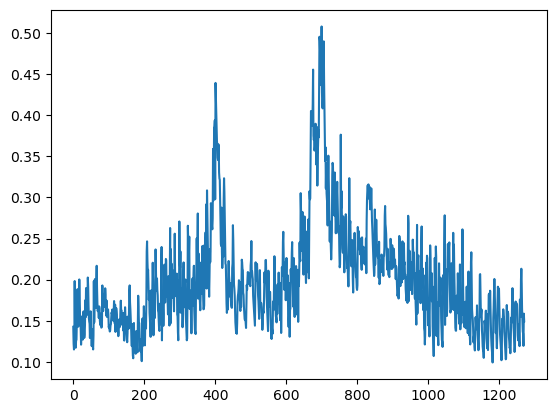

In [21]:
plt.plot(full_data[1][0][3])

In [12]:
import os
os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"

trend: var  
resid, se8760: anfis  
se24, se360: lstm

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

from sklearn.metrics import mean_squared_error 

import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, aic

import tensorflow as tf
from tensorflow import keras

from pyFTS.common import Transformations, Util as cUtil, Membership as mf
from pyFTS.benchmarks import benchmarks as bchmk, Util as bUtil, Measures
from pyFTS.partitioners import CMeans, Grid, FCM, Huarng, Entropy, Util as pUtil
from pyFTS.models.multivariate import common, variable, mvfts
from pyFTS.models import hofts
from pyFTS.models import chen

import seaborn as sn

import math

from joblib import dump, load

In [24]:
class predict_model:
    
    def __init__(self, df):
        self.dataset = df
        
        self.trend_model = 0
        
        self.scaled_data = self.dataset[1]
        self.scaler_X = []
        self.scaler_y = []
        self.seasonal_model = 0
        
        self.df = []
    
    @staticmethod
    def SMAPE(y_test, y_pred):
        y_test = y_test.to_numpy(); y_pred = y_pred.to_numpy()
        return np.mean((np.abs(y_test-y_pred))/(np.abs(y_test)+np.abs(y_pred)))*100

    @staticmethod
    def RMSE(y_test, y_pred):
        return np.sqrt(mean_squared_error(y_test, y_pred))
    
    @staticmethod
    def SMAPE_np(y_test, y_pred):
        return np.mean((np.abs(y_test-y_pred))/(np.abs(y_test)+np.abs(y_pred)))*100
    
    @staticmethod
    def RMSE_np(y_test, y_pred):
        return np.mean((y_test - y_pred)**2)
        
    def fit_VAR_model(self, lag = 15, step = 3):
        given_data = self.dataset[0] # trend
        
        least_rmse = 1000

        for idx, block_data in enumerate(given_data):
            X_train = block_data[0]
            y_train = block_data[1]
            X_valid = block_data[2]
            y_valid = block_data[3]
            
            SMAPE_sum = 0
            RMSE_sum = 0
            
            df_train = pd.merge(y_train, X_train, left_index=True, right_index=True, how='inner')
            df_valid = pd.merge(y_valid, X_valid, left_index=True, right_index=True, how='inner')

            print("Modeling trend component... SPLIT %d"%idx, end = "\r")
            trend_premodel = VAR(df_train)
            trend_model = trend_premodel.fit(lag)

            df_valid = pd.concat([df_train.loc[-lag: , :], df_valid])

            for i in range(0, len(df_valid)-lag):
                lagged_values = df_valid.values[i: i+lag]
                forecast = pd.DataFrame(trend_model.forecast(y = lagged_values, steps = step), columns=df_train.columns)
                SMAPE_sum += self.SMAPE(forecast.iloc[:step, [0]], df_valid.iloc[i+1: i+step+1, [0]])
                RMSE_sum += self.RMSE(forecast.iloc[:step, [0]], df_valid.iloc[i+1: i+step+1, [0]]) 
            
            print(f"TREND SPLIT {idx}: SMAPE avg {SMAPE_sum / (len(df_valid) - lag)}, RMSE avg {RMSE_sum / (len(df_valid) - lag)}")
            
            if least_rmse > RMSE_sum / (len(df_valid) - lag):
                least_rmse = RMSE_sum / (len(df_valid) - lag)
                self.trend_best_model = trend_model
                
        dump(self.trend_best_model, 'trend_model.joblib')
        
    def eval_VAR_model(self, df):
        
        lag = 15; step = 3
        
        model = load('trend_model.joblib')
        
        given_data = df[0]
        
        X_test = given_data[0][0]
        y_test = given_data[0][1]
        
        df_test = pd.merge(y_test, X_test, left_index=True, right_index=True, how='inner')
        
        pred = []
        
        for i in range(0, len(df_test)-lag):
            lagged_values = df_test.values[i: i+lag]
            forecast = pd.DataFrame(model.forecast(y = lagged_values, steps = step), columns=df_test.columns)
            pred.append([[forecast[0][0]], [forecast[0][1]], [forecast[0][2]]])
            
#             forecast = forecast[0]
#             print(forecast)
        return np.array(pred)

    def fit_VAR_model(self, df):
        
        lag = 15; step = 3
        
        model = load('trend_model.joblib')
        
        given_data = df[0]
        
        X_test = given_data[0][0]
        
    ###################         
            
            
#     def min_max_scaling(self, train_df, valid_df):
#         scaler = MinMaxScaler()
#         scaler = scaler.fit(train_df)

#         train_scaled = scaler.transform(train_df)
#         train_scaled = pd.DataFrame(train_scaled)

#         valid_scaled = scaler.transform(valid_df)
#         valid_scaled = pd.DataFrame(valid_scaled)

#         return scaler, train_scaled, valid_scaled
    
#     def inverse_min_max_scaling(self, scaler, df):
#         return scaler.inverse_transform(df)
    
    # def do_scaling(self):
    #     for j in range(len(self.dataset[1])):
    #         (scaler, self.scaled_data[j][0], self.scaled_data[j][2]) = self.min_max_scaling(self.dataset[j][0], self.dataset[j][2])
    #         self.scaler_X.append(scaler)
    #         (scaler, self.scaled_data[j][1], self.scaled_data[j][3]) = self.min_max_scaling(self.dataset[j][1], self.dataset[j][3])
    #         self.scaler_y.append(scaler)
    
    def make_dataset(self, X_df, y_df, time_step = 8, y_step = 3):
        new_X_df = []
        new_y_df = []
        X_df = pd.concat([X_df, y_df], axis=1)
        for i in range(len(X_df) - time_step - y_step + 1):
            new_X_df.append(np.array(X_df.iloc[i:i + time_step]))
            new_y_df.append(np.array(y_df.iloc[i + time_step: i + time_step + y_step]))
        return np.array(new_X_df), np.array(new_y_df)
    
    
    def calculate_metrics(self, true, pred):
        true = pd.DataFrame(true)
        pred = pd.DataFrame(pred)
        mae = (true - pred).abs().mean()
        mape = (true - pred).abs().div(true).mean() * 100
        rmse = np.sqrt(((true - pred) ** 2).mean())
        return {
            "mae": mae,
            "mape": mape,
            "rmse": rmse,
        }
    
    def Bi_Seq2_model(self, feature_num, time_step, y_step):

        model = keras.Sequential()
        model.add(keras.layers.Bidirectional(keras.layers.LSTM(128, activation = 'tanh', input_shape = (time_step, feature_num), return_sequences = True, kernel_initializer='he_normal')))
        model.add(keras.layers.Bidirectional(keras.layers.LSTM(64, activation = 'tanh')))
        model.add(keras.layers.RepeatVector(y_step))
        model.add(keras.layers.LSTM(64, activation = 'tanh', return_sequences = True))
        model.add(keras.layers.LSTM(128, activation = 'tanh', return_sequences = True))
        model.add(keras.layers.TimeDistributed(keras.layers.Dense(1)))
        #model.compile(optimizer = 'nadam', loss = 'mse')
        #model.summary()

        return model
    
    def Bi_Seq2_fit(self, model, X_train, y_train, X_valid, y_valid, time_step = 8, patience = 50, epochs = 1000):

        model.compile(loss='mean_squared_error', optimizer = 'nadam')
        early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience = patience)

        history = model.fit(X_train, y_train, 
                            epochs = epochs,
                            validation_data = (X_valid, y_valid), 
                            callbacks = [early_stop],
                            shuffle = False)
        return history
    
    def fit_Bi_Seq2(self):
        
        time_step = 30
        #time_step_list = [20, 30, 40]
        
        y_step = 3
        patience = 200
        epochs = 1000
        
        pred = []
        
        with tf.device('/device:GPU:0'):
            least_rmse = 1000
            best_time_step = 20
            for i in range(3):
                (lstm_X_train, lstm_y_train) = self.make_dataset(self.scaled_data[i][0], self.scaled_data[i][1], time_step)
                (lstm_X_valid, lstm_y_valid) = self.make_dataset(self.scaled_data[i][2], self.scaled_data[i][3], time_step)

                seasonal_model = self.Bi_Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)

                history = self.Bi_Seq2_fit(seasonal_model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

                pred_temp = seasonal_model.predict(lstm_X_valid)

                rmse = 0

                for j in range(y_step):
                    pred.append(pred_temp)
                    mat = self.calculate_metrics(lstm_y_valid[:, j], pred_temp[:, j])
                    print(mat)
                    rmse = rmse + mat['rmse'][0]

                    plt.plot(lstm_y_valid[:, j], label = 'actual')
                    plt.plot(pred_temp[:, j], label = 'prediction')
                        # print(self.calculate_metrics(self.inverse_min_max_scaling(self.scaler_y[i], lstm_y_valid[:, j]), self.inverse_min_max_scaling(self.scaler_y[i], pred_temp[:, j])))
                        # plt.plot(self.inverse_min_max_scaling(self.scaler_y[i], lstm_y_valid[:, j]), label = 'actual')
                        # plt.plot(self.inverse_min_max_scaling(self.scaler_y[i], pred_temp[:, j]), label = 'prediction')
                    plt.legend()
                    plt.show()

                rmse = rmse / y_step

                if rmse < least_rmse:
                    least_rmse = rmse
                    best_time_step = time_step
                    self.best_seasonal_model = seasonal_model
                        
        print(best_time_step)
                    
        self.best_seasonal_model.save('seasonal_model.h5')
    
    def pred_Bi_Seq2(self, df):
        time_step = 30
        
        model = tf.keras.models.load_model('seasonal_model.h5')
        
        seasonal_df = df[1]
        (lstm_X_test, lstm_y_test) = self.make_dataset(seasonal_df[0][0], seasonal_df[0][1], time_step)
        
        pred = model.predict(lstm_X_test)
        
        return pred
        
        
    ###################       
            
        
    def make_dataset2(self):
        df = self.dataset[2]
        
        for split in df:
            train_data = pd.concat([split[0], split[1]], axis = 1)
            valid_data = pd.concat([split[2], split[3]], axis = 1)
            split_data = pd.concat([train_data, valid_data]).reset_index()
            self.df.append(split_data)
    
    def ANFIS_model(self, unique_name = "default_data"):
        self.make_dataset2()
        
        for i in range(len(self.df)):
            df = self.df[i]
            print("Formatting the Dataset", end = "\r")
            tested_data = []
            num_cols = len(df.columns) - 1
            for i in range(1, num_cols + 1):
                tested_data.append(df.iloc[:,i].to_numpy())

            tdiff = Transformations.Differential(1)

            dataset_names = ["pca%d"%i for i in range(1, num_cols)]
            dataset_names.append("waterlvl")

            print("Data Partitioning... on progess", end = " ")

            partitioners = {}
            partitioners_diff = {}
            # fig, ax = plt.subplots(nrows=num_cols//3*2, ncols=3, figsize=[20,5])


            for count, dataset_name in enumerate(dataset_names):
                print(count, end = " ")
                dataset = tested_data[count]

                partitioner = CMeans.CMeansPartitioner(data = dataset, npart=12)
                partitioners[dataset_name] = partitioner

                partitioner_diff = CMeans.CMeansPartitioner(data = dataset, npart=12, transformation = tdiff)
                partitioners_diff[dataset_name] = partitioner_diff

                # pUtil.plot_sets(dataset, [partitioner.sets], titles=[dataset_name], axis = ax[count//3][count%3])
                # pUtil.plot_sets(dataset, [partitioner_diff.sets], titles=[''], axis = ax[count//3 + num_cols//3][count%3])

            print("                                                                             ", end = "\r")

            print("Modeling... on progress ")

            train_split = 4996

            for count, dataset_name in enumerate(dataset_names):
                print(count, end = " ")
                dataset = tested_data[count]

                for order in [2]:

                    model2 = hofts.HighOrderFTS(partitioner = partitioners_diff[dataset_name], order = order)
                    model2.name = dataset_name + str(order)
                    model2.append_transformation(tdiff)
                    model2.fit(dataset[:train_split], save_model=True, file_path=f'./data_ANFIS/{unique_name}_diff_'+dataset_name+str(order))

            print("                                                                             ", end = "\r")

            print("Predicting and Visualizing... on progress ")

            fig, ax = plt.subplots(nrows=num_cols*2, ncols=1, figsize=[20,15])

            for count, dataset_name in enumerate(dataset_names):
                dataset = tested_data[count]

                for order in [2]:
                    orig_data = dataset[train_split+1:train_split+1239]
                    ax[count*2].plot(orig_data)

                    model2 = cUtil.load_obj(f'./data_ANFIS/{unique_name}_diff_'+dataset_name+str(order))
                    forecasts = model2.predict(dataset[train_split:train_split+1240])
                    # print(forecasts)

                    ax[count*2].plot(forecasts)
                    ax[count*2].set_title(unique_name + '_' + dataset_name)


                    # print("orig_data:", orig_data)
                    # print("pred_data:", forecasts)
                    diff_data_list = []
                    for i in range(len(forecasts)):
                        orig = orig_data[i]
                        pred = forecasts[i]
                        diff_data_list.append(orig - pred)
                    diff_data = pd.DataFrame({"error": diff_data_list})
                    ax[count*2+1].plot(diff_data)
                    
                    SMAPE_ANFIS = self.SMAPE_np(orig_data, forecasts)
                    RMSE_ANFIS = self.RMSE_np(orig_data, forcasts)

            plt.tight_layout()

            print("                                                                             ", end = "\r")
            
            print(f"TREND SPLIT {count}: SMAPE avg {SMAPE_ANFIS}, RMSE avg {RMSE_ANFIS}")
            print("Evaluating the Model... on progress ")

            rows = []

            for count,dataset_name in enumerate(dataset_names):
                print(count, end = " ")

                dataset = tested_data[count]
                test = dataset[train_split+1:train_split+1240]
                
                
            print("\n")
            print(pd.DataFrame(rows,columns=["Order", "Dataset","RMSE","SMAPE","Theil's U"]))

        return
    
    #######################
    
    def eval_model(self, pre, trend_pred, seasonal_pred, resid_pred, df): #pre: instance of preprocessing class
        
        y_step = 3
        
        y_pred = np.concatenate([trend_pred, seasonal_pred, resid_pre], axis = 2)
        y_pred = pre.inverse_normalize(y_pred)
        y_pred = np.transpose(np.sum(y_pred, axis=2))
        
        y_real_trend = np.array(df[0][0][1])
        y_real_seasonal = np.array(df[1][0][1])
        y_real_resid = np.array(df[2][0][1])
        
        y_real = np.concatenate([y_real_trend, y_real_seasonal, y_real_resid], axis = 2)
        y_real = np.transpose(np.sum(y_real, axis = 2))
        
        eval_mat = []
        
        for i in range(y_step):
            eval_mat.append(self.calculate_metrics(y_pred[i], y_real[i]))
            
            plt.plot(y_real[i], label = 'actual')
            plt.plot(y_pred[i], label = 'prediction')
            
        return eval_mat

## FITTING

In [15]:
mmmy_model = predict_model(full_data)

In [27]:
(lstm_X_train, lstm_y_train) = mmmy_model.make_dataset(full_data[1][0][0], full_data[1][0][1], 30)

In [45]:
lstm_X_train

array([[[-4.82990344e-01,  3.52267995e-02,  1.09131037e-01, ...,
          2.54575517e-02, -5.24781503e-03,  3.23779839e-01],
        [-5.10002824e-01, -4.03263973e-04,  1.11272900e-01, ...,
          3.59926365e-02,  5.17825927e-03,  3.06130368e-01],
        [-5.36683337e-01,  6.13068005e-02,  1.09039643e-01, ...,
          1.97036815e-02, -1.97090646e-02,  3.25985647e-01],
        ...,
        [-6.98342273e-01, -2.30741299e-03,  2.53722015e-01, ...,
          1.58643625e-02, -2.56406182e-02,  3.63996090e-01],
        [-7.10935822e-01, -2.44191066e-01,  2.71938208e-01, ...,
         -1.80118538e-03, -1.01829129e-02,  4.00740531e-01],
        [-6.84069575e-01, -1.48240252e-01,  2.56867728e-01, ...,
          7.93546876e-03, -2.07418444e-02,  3.72454998e-01]],

       [[-5.10002824e-01, -4.03263973e-04,  1.11272900e-01, ...,
          3.59926365e-02,  5.17825927e-03,  3.06130368e-01],
        [-5.36683337e-01,  6.13068005e-02,  1.09039643e-01, ...,
          1.97036815e-02, -1.97090646e

[[[array([[-0.08344205,  0.04274982, -0.03545132, -0.05365036, -0.0337785 ,
           -0.01643934, -0.03859581, -0.00987988, -0.00314369, -0.00159658,
            0.01322576],
          [-0.11937269,  0.04452726, -0.03782113, -0.03429276, -0.01452644,
            0.01212292, -0.04275304, -0.01502725,  0.02053202, -0.01847763,
            0.00432403],
          [-0.09320083,  0.00543003, -0.04135115, -0.01174286, -0.02736529,
            0.00811151, -0.0277652 , -0.00282419,  0.01154966, -0.01101466,
            0.00728624]])]]]

In [32]:
len(lstm_y_train)

5055

In [30]:
mmmy_model.fit_VAR_model()
trend_pred = mmmy_model.pred_VAR_model(full_data_test)
trend_pred

TREND SPLIT 0: SMAPE avg 1.463164811742919, RMSE avg 0.004152613225105907
TREND SPLIT 1: SMAPE avg 1.286498888181281, RMSE avg 0.002446181166291362
TREND SPLIT 2: SMAPE avg 0.5228380135884726, RMSE avg 0.0023378897555802114
TREND SPLIT 3: SMAPE avg 2.641713082902488, RMSE avg 0.016177077579991667
TREND SPLIT 4: SMAPE avg 0.29201825016202887, RMSE avg 0.0012579229031589162
TREND SPLIT 5: SMAPE avg 0.2684390639262378, RMSE avg 0.0032758907845625083
TREND SPLIT 6: SMAPE avg 2.5760023438288275, RMSE avg 0.013245952683943303


array([[[-0.96966253],
        [-0.96969018],
        [-0.96971831]],

       [[-0.96969018],
        [-0.96971831],
        [-0.96974693]],

       [[-0.96971831],
        [-0.96974693],
        [-0.96977604]],

       ...,

       [[-1.08109187],
        [-1.08256533],
        [-1.08403912]],

       [[-1.08256533],
        [-1.08403912],
        [-1.08551323]],

       [[-1.08403912],
        [-1.08551323],
        [-1.08698767]]])

In [25]:
# time_step = 30
# patience = 100
mmmy_model.fit_Bi_Seq2()
seasonal_pred = mmmy_model.pred_Bi_Seq2(full_data_test)

Epoch 1/1000


2023-10-20 04:00:22.609543: E tensorflow/stream_executor/cuda/cuda_dnn.cc:328] Could not create cudnn handle: CUDNN_STATUS_INTERNAL_ERROR
2023-10-20 04:00:22.609610: W tensorflow/core/framework/op_kernel.cc:1767] OP_REQUIRES failed at cudnn_rnn_ops.cc:1510 : Unknown: Fail to find the dnn implementation.
2023-10-20 04:00:22.636338: E tensorflow/stream_executor/cuda/cuda_dnn.cc:328] Could not create cudnn handle: CUDNN_STATUS_INTERNAL_ERROR
2023-10-20 04:00:22.636402: W tensorflow/core/framework/op_kernel.cc:1767] OP_REQUIRES failed at cudnn_rnn_ops.cc:1510 : Unknown: Fail to find the dnn implementation.


UnknownError:    Fail to find the dnn implementation.
	 [[{{node CudnnRNN}}]]
	 [[sequential_3/bidirectional_6/forward_lstm_12/PartitionedCall]] [Op:__inference_train_function_65409]

Function call stack:
train_function -> train_function -> train_function


Epoch 1/1000
159/159 [==============================] - 6s 38ms/step - loss: 0.5448 - val_loss: 0.2614
Epoch 2/1000
159/159 [==============================] - 5s 30ms/step - loss: 0.3052 - val_loss: 0.1776
Epoch 3/1000
159/159 [==============================] - 5s 30ms/step - loss: 0.2321 - val_loss: 0.1804
Epoch 4/1000
159/159 [==============================] - 5s 30ms/step - loss: 0.1920 - val_loss: 0.1745
Epoch 5/1000
159/159 [==============================] - 4s 28ms/step - loss: 0.1636 - val_loss: 0.1755
Epoch 6/1000
159/159 [==============================] - 5s 30ms/step - loss: 0.1534 - val_loss: 0.2334
Epoch 7/1000
159/159 [==============================] - 5s 29ms/step - loss: 0.1549 - val_loss: 0.2162
Epoch 8/1000
159/159 [==============================] - 5s 29ms/step - loss: 0.1408 - val_loss: 0.1708
Epoch 9/1000
159/159 [==============================] - 5s 30ms/step - loss: 0.1464 - val_loss: 0.1571
Epoch 10/1000
159/159 [==============================] - 5s 30ms/step - l

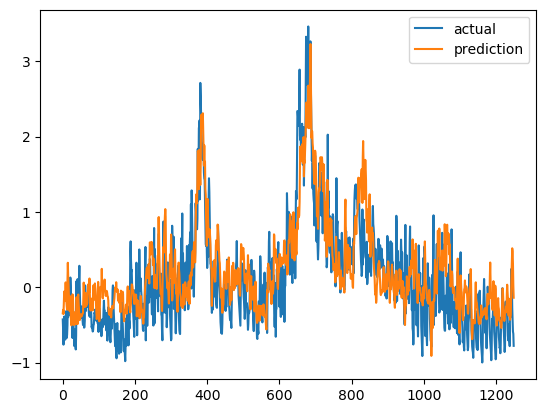

{'mae': 0    0.334694
dtype: float64, 'mape': 0   -65.073357
dtype: float64, 'rmse': 0    0.426654
dtype: float64}


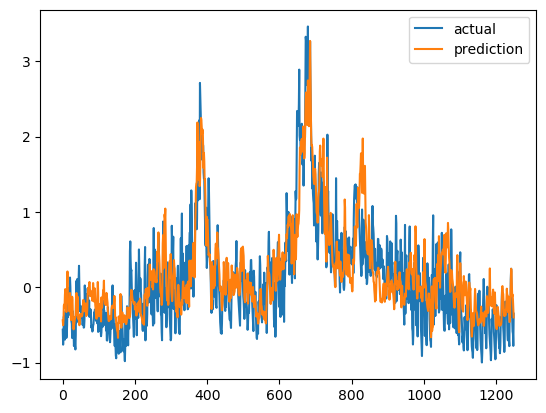

{'mae': 0    0.328796
dtype: float64, 'mape': 0   -100.72134
dtype: float64, 'rmse': 0    0.417678
dtype: float64}


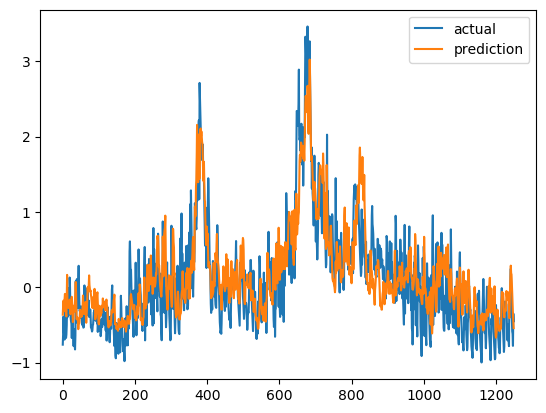

Epoch 1/1000
159/159 [==============================] - 9s 54ms/step - loss: 0.2572 - val_loss: 0.1545
Epoch 2/1000
159/159 [==============================] - 6s 40ms/step - loss: 0.1805 - val_loss: 0.1397
Epoch 3/1000
159/159 [==============================] - 6s 39ms/step - loss: 0.1425 - val_loss: 0.1322
Epoch 4/1000
159/159 [==============================] - 6s 40ms/step - loss: 0.1283 - val_loss: 0.1366
Epoch 5/1000
159/159 [==============================] - 5s 34ms/step - loss: 0.1146 - val_loss: 0.1404
Epoch 6/1000
159/159 [==============================] - 5s 31ms/step - loss: 0.1171 - val_loss: 0.1301
Epoch 7/1000
159/159 [==============================] - 7s 42ms/step - loss: 0.1046 - val_loss: 0.1294
Epoch 8/1000
159/159 [==============================] - 6s 36ms/step - loss: 0.0935 - val_loss: 0.1301
Epoch 9/1000
159/159 [==============================] - 6s 36ms/step - loss: 0.0825 - val_loss: 0.1341
Epoch 10/1000
159/159 [==============================] - 5s 30ms/step - l

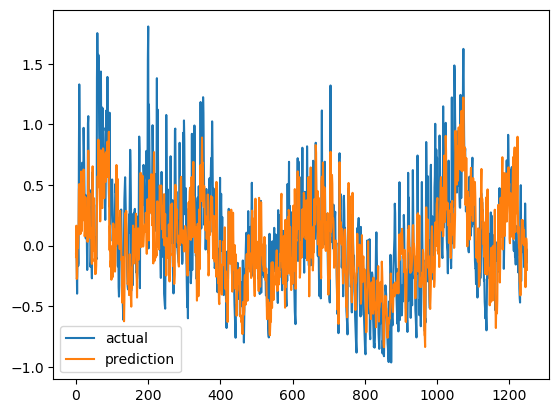

{'mae': 0    0.284152
dtype: float64, 'mape': 0    39.26198
dtype: float64, 'rmse': 0    0.373357
dtype: float64}


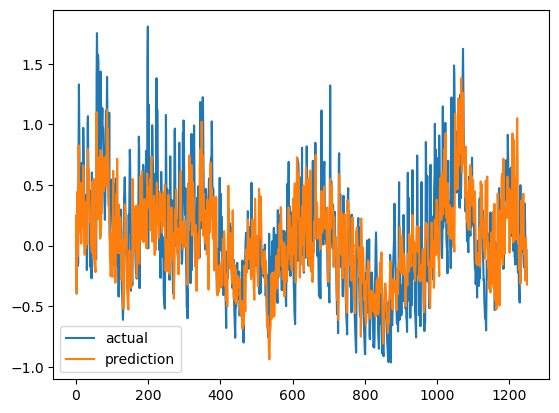

{'mae': 0    0.284439
dtype: float64, 'mape': 0    60.811368
dtype: float64, 'rmse': 0    0.372884
dtype: float64}


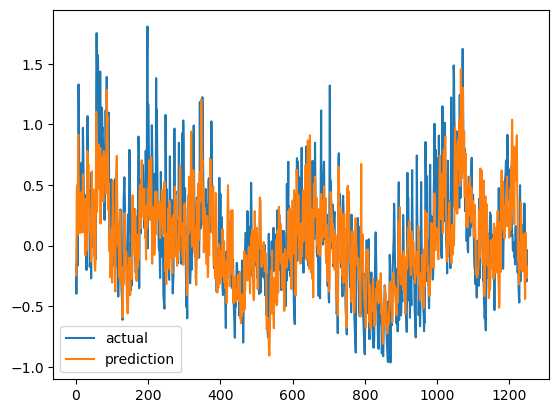

Epoch 1/1000
159/159 [==============================] - 7s 42ms/step - loss: 0.2004 - val_loss: 0.4574
Epoch 2/1000
159/159 [==============================] - 5s 28ms/step - loss: 0.1479 - val_loss: 0.3354
Epoch 3/1000
159/159 [==============================] - 5s 29ms/step - loss: 0.1281 - val_loss: 0.3014
Epoch 4/1000
159/159 [==============================] - 5s 29ms/step - loss: 0.1124 - val_loss: 0.3132
Epoch 5/1000
159/159 [==============================] - 5s 29ms/step - loss: 0.1020 - val_loss: 0.3208
Epoch 6/1000
159/159 [==============================] - 5s 30ms/step - loss: 0.0949 - val_loss: 0.3069
Epoch 7/1000
159/159 [==============================] - 5s 29ms/step - loss: 0.0876 - val_loss: 0.3552
Epoch 8/1000
159/159 [==============================] - 4s 28ms/step - loss: 0.0832 - val_loss: 0.3539
Epoch 9/1000
159/159 [==============================] - 5s 29ms/step - loss: 0.0841 - val_loss: 0.3953
Epoch 10/1000
159/159 [==============================] - 5s 28ms/step - l

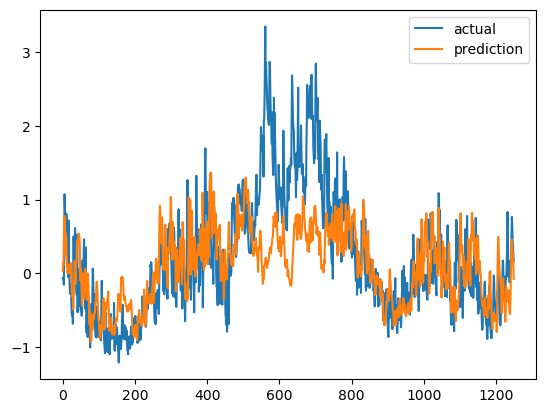

{'mae': 0    0.442659
dtype: float64, 'mape': 0    1.46261
dtype: float64, 'rmse': 0    0.623904
dtype: float64}


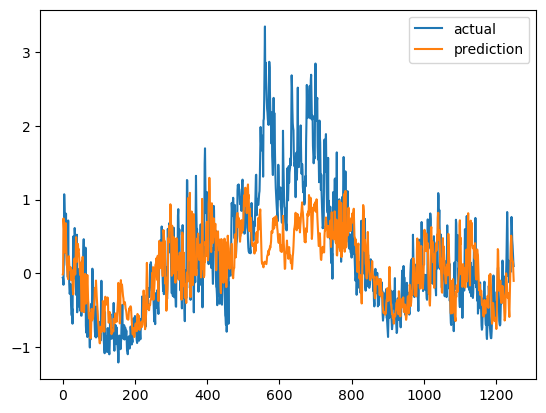

{'mae': 0    0.415591
dtype: float64, 'mape': 0    0.764973
dtype: float64, 'rmse': 0    0.58629
dtype: float64}


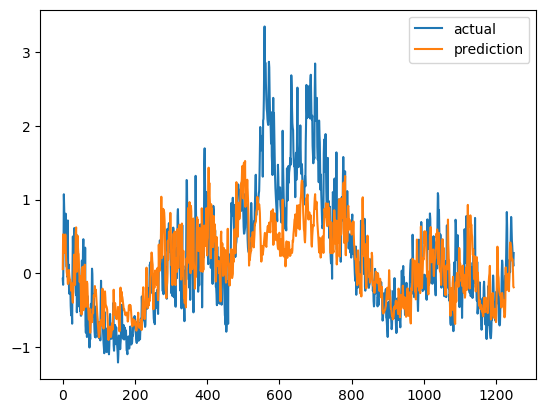

Epoch 1/1000
158/158 [==============================] - 6s 40ms/step - loss: 0.4959 - val_loss: 0.2133
Epoch 2/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.2757 - val_loss: 0.1767
Epoch 3/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.2083 - val_loss: 0.1702
Epoch 4/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.1902 - val_loss: 0.1982
Epoch 5/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.1671 - val_loss: 0.2174
Epoch 6/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.1567 - val_loss: 0.1708
Epoch 7/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.1512 - val_loss: 0.1740
Epoch 8/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.1428 - val_loss: 0.1701
Epoch 9/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.1425 - val_loss: 0.2044
Epoch 10/1000
158/158 [==============================] - 5s 31ms/step - l

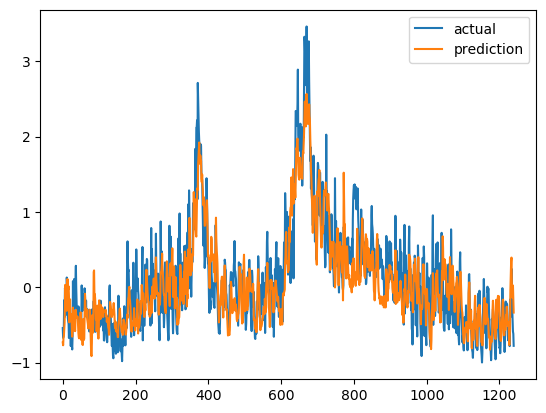

{'mae': 0    0.307085
dtype: float64, 'mape': 0   -64.070057
dtype: float64, 'rmse': 0    0.392286
dtype: float64}


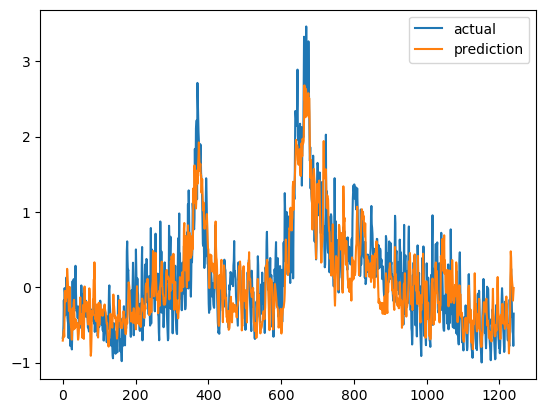

{'mae': 0    0.307306
dtype: float64, 'mape': 0   -75.351278
dtype: float64, 'rmse': 0    0.399202
dtype: float64}


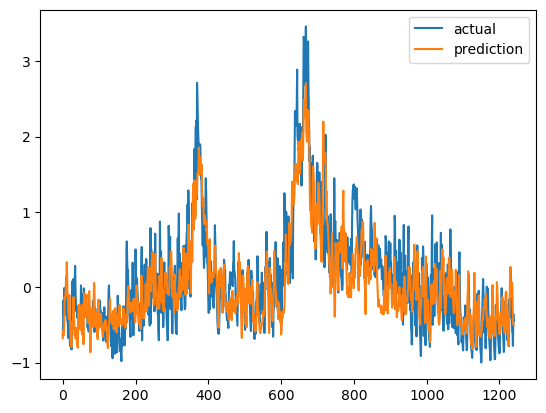

Epoch 1/1000
158/158 [==============================] - 6s 39ms/step - loss: 0.2470 - val_loss: 0.1403
Epoch 2/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.1761 - val_loss: 0.1255
Epoch 3/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.1428 - val_loss: 0.1276
Epoch 4/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.1236 - val_loss: 0.1213
Epoch 5/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.1102 - val_loss: 0.1284
Epoch 6/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0950 - val_loss: 0.1216
Epoch 7/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0807 - val_loss: 0.1159
Epoch 8/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0782 - val_loss: 0.1219
Epoch 9/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0735 - val_loss: 0.1181
Epoch 10/1000
158/158 [==============================] - 5s 31ms/step - l

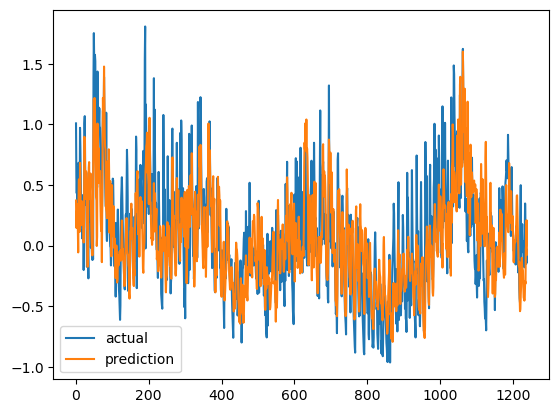

{'mae': 0    0.250834
dtype: float64, 'mape': 0   -69.0829
dtype: float64, 'rmse': 0    0.331222
dtype: float64}


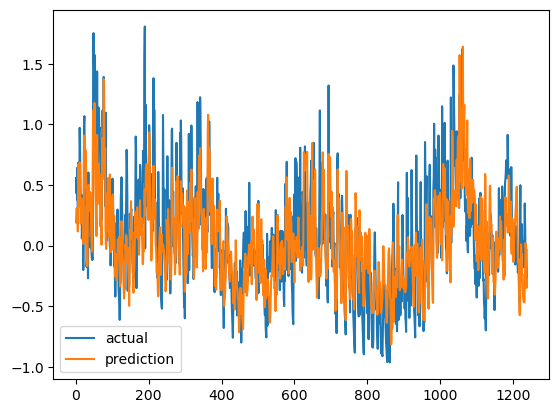

{'mae': 0    0.249121
dtype: float64, 'mape': 0   -101.295894
dtype: float64, 'rmse': 0    0.328574
dtype: float64}


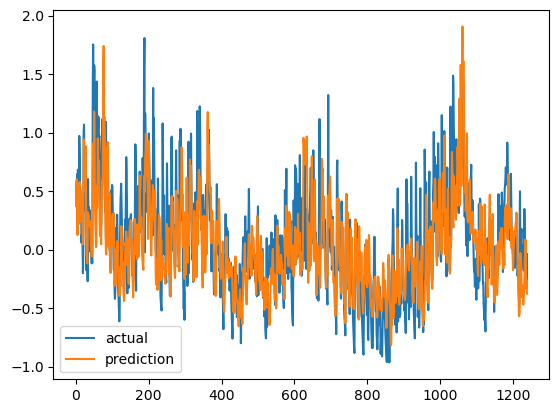

Epoch 1/1000
158/158 [==============================] - 6s 39ms/step - loss: 0.1937 - val_loss: 0.4711
Epoch 2/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.1372 - val_loss: 0.3196
Epoch 3/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.1183 - val_loss: 0.2993
Epoch 4/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.1038 - val_loss: 0.2775
Epoch 5/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0920 - val_loss: 0.2689
Epoch 6/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0830 - val_loss: 0.2975
Epoch 7/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0762 - val_loss: 0.2871
Epoch 8/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0699 - val_loss: 0.2671
Epoch 9/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0677 - val_loss: 0.2505
Epoch 10/1000
158/158 [==============================] - 5s 31ms/step - l

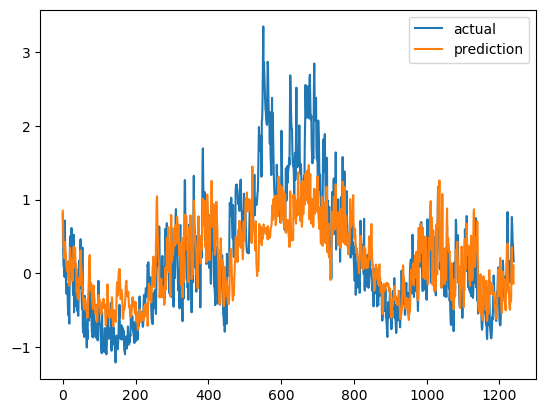

{'mae': 0    0.394539
dtype: float64, 'mape': 0   -15.947718
dtype: float64, 'rmse': 0    0.550492
dtype: float64}


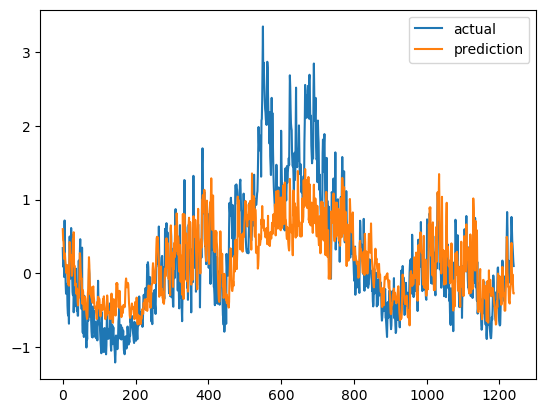

{'mae': 0    0.368653
dtype: float64, 'mape': 0   -29.698846
dtype: float64, 'rmse': 0    0.500236
dtype: float64}


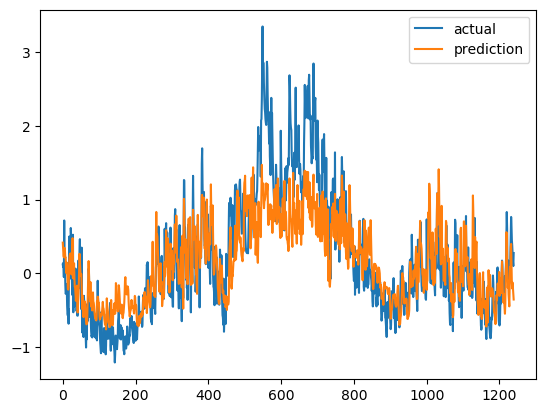

Epoch 1/1000
158/158 [==============================] - 6s 41ms/step - loss: 0.5078 - val_loss: 0.2353
Epoch 2/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.2855 - val_loss: 0.2259
Epoch 3/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.2222 - val_loss: 0.1877
Epoch 4/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.1916 - val_loss: 0.1611
Epoch 5/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.1652 - val_loss: 0.1824
Epoch 6/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.1611 - val_loss: 0.1832
Epoch 7/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.1592 - val_loss: 0.1692
Epoch 8/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.1438 - val_loss: 0.2057
Epoch 9/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.1388 - val_loss: 0.2128
Epoch 10/1000
158/158 [==============================] - 5s 34ms/step - l

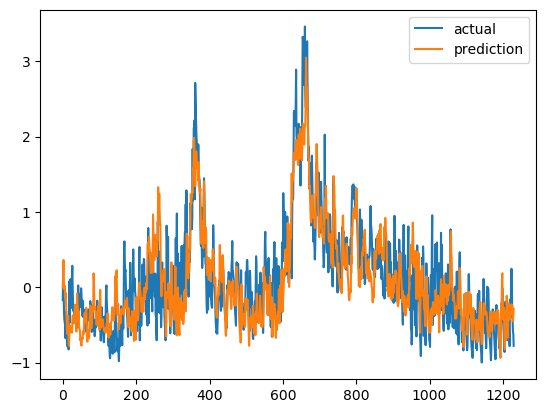

{'mae': 0    0.315546
dtype: float64, 'mape': 0   -75.36267
dtype: float64, 'rmse': 0    0.405704
dtype: float64}


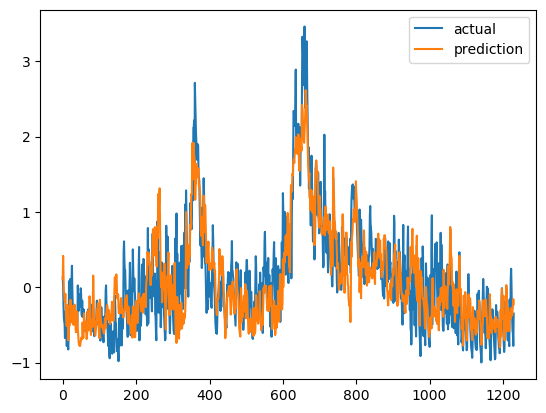

{'mae': 0    0.33472
dtype: float64, 'mape': 0   -140.246496
dtype: float64, 'rmse': 0    0.433787
dtype: float64}


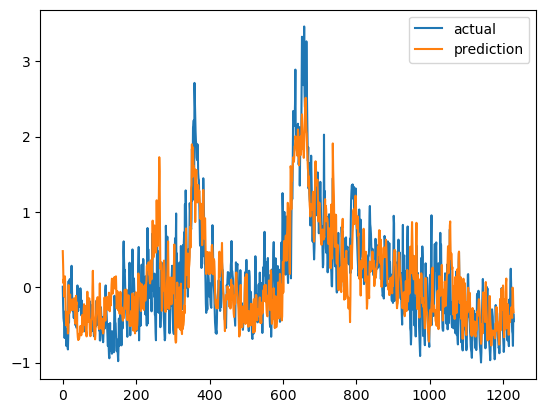

Epoch 1/1000
158/158 [==============================] - 8s 49ms/step - loss: 0.2581 - val_loss: 0.1459
Epoch 2/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.1841 - val_loss: 0.1335
Epoch 3/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.1500 - val_loss: 0.1300
Epoch 4/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.1230 - val_loss: 0.1353
Epoch 5/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.1239 - val_loss: 0.1415
Epoch 6/1000
158/158 [==============================] - 5s 35ms/step - loss: 0.1039 - val_loss: 0.1382
Epoch 7/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.0960 - val_loss: 0.1392
Epoch 8/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.0964 - val_loss: 0.1418
Epoch 9/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.0928 - val_loss: 0.1488
Epoch 10/1000
158/158 [==============================] - 5s 33ms/step - l

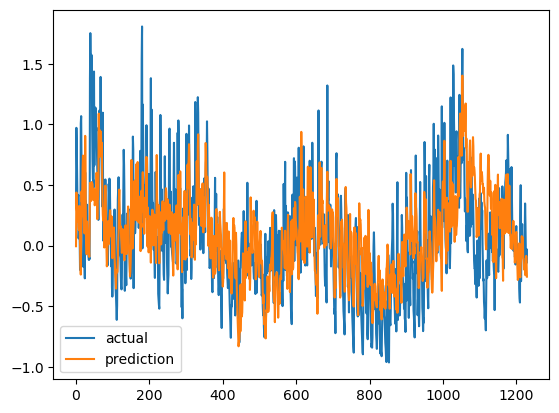

{'mae': 0    0.286069
dtype: float64, 'mape': 0   -125.823076
dtype: float64, 'rmse': 0    0.368138
dtype: float64}


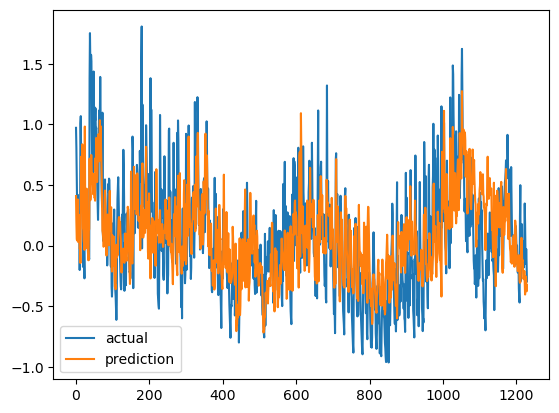

{'mae': 0    0.284154
dtype: float64, 'mape': 0   -164.817718
dtype: float64, 'rmse': 0    0.369298
dtype: float64}


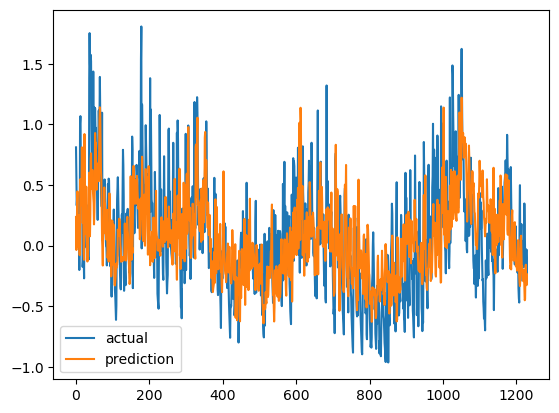

Epoch 1/1000
158/158 [==============================] - 6s 41ms/step - loss: 0.1984 - val_loss: 0.4779
Epoch 2/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.1444 - val_loss: 0.3424
Epoch 3/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.1246 - val_loss: 0.2887
Epoch 4/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.1075 - val_loss: 0.2707
Epoch 5/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.0990 - val_loss: 0.2775
Epoch 6/1000
158/158 [==============================] - 5s 35ms/step - loss: 0.0914 - val_loss: 0.2931
Epoch 7/1000
158/158 [==============================] - 5s 35ms/step - loss: 0.0925 - val_loss: 0.2727
Epoch 8/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.0916 - val_loss: 0.2472
Epoch 9/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.0847 - val_loss: 0.3023
Epoch 10/1000
158/158 [==============================] - 5s 34ms/step - l

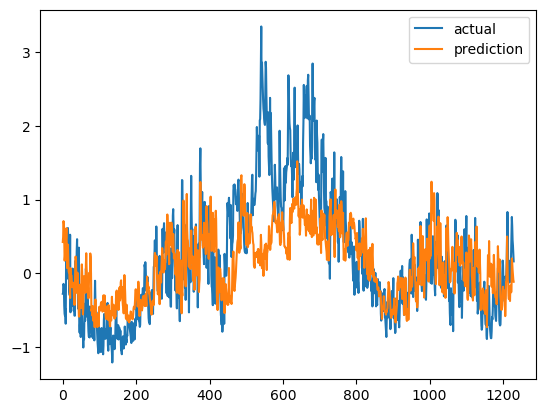

{'mae': 0    0.441593
dtype: float64, 'mape': 0   -67.369288
dtype: float64, 'rmse': 0    0.598353
dtype: float64}


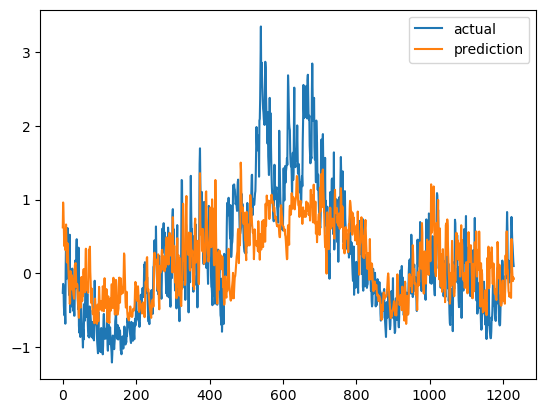

{'mae': 0    0.418121
dtype: float64, 'mape': 0   -43.631571
dtype: float64, 'rmse': 0    0.568902
dtype: float64}


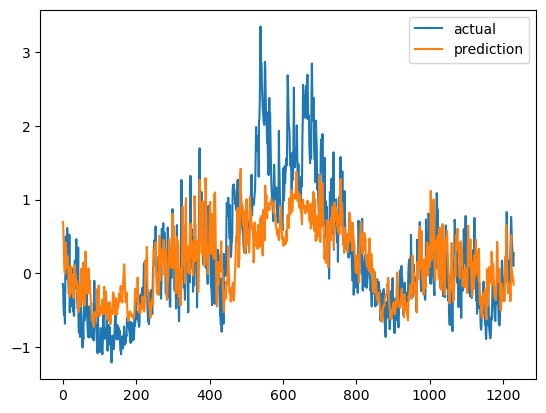

30


In [50]:
# time_step = 20, 30, 40
# patience = 100
# 절대 건들지 말 것.
mmmy_model.fit_Bi_Seq2()
seasonal_pred = mmmy_model.pred_Bi_Seq2(full_data_test)

In [586]:
seasonal_pred
# seasonal_pred_real = pre.inverse_normalize(seasonal_pred[0])

array([[[ 3.0147958 ],
        [ 2.936362  ],
        [ 2.9249835 ]],

       [[-0.11783904],
        [-0.18006557],
        [-0.18889348]],

       [[-0.20714127],
        [-0.32126647],
        [-0.336793  ]],

       ...,

       [[ 0.32097217],
        [ 0.4926343 ],
        [ 0.5447724 ]],

       [[ 0.29484507],
        [ 0.45079404],
        [ 0.4962585 ]],

       [[ 0.25326008],
        [ 0.38408485],
        [ 0.41955605]]], dtype=float32)

Modeling... on progress progess 0 1 2 3 4                                                                              
Predicting and Visualizing... on progress                                              


ValueError: operands could not be broadcast together with shapes (1239,) (1238,) 

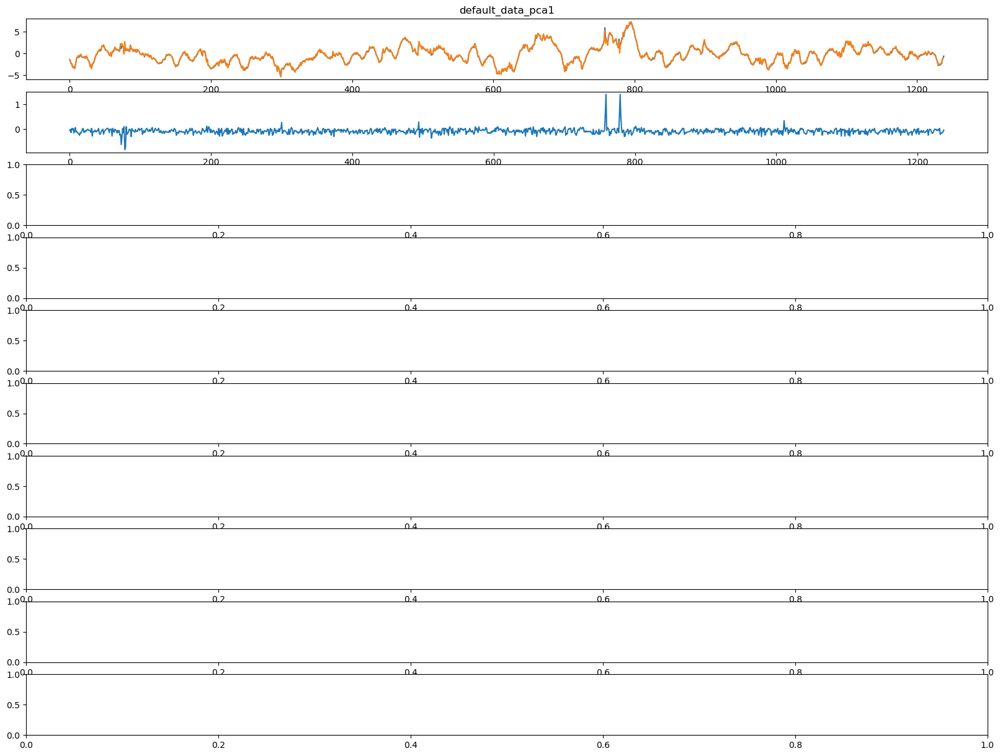

In [122]:
mmmy_model.ANFIS_model()

---

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, aic

import seaborn as sn

import math

In [19]:
from sklearn.metrics import mean_squared_error 
def SMAPE(y_test, y_pred):
    y_test = y_test.to_numpy(); y_pred = y_pred.to_numpy()
    return np.mean((np.abs(y_test-y_pred))/(np.abs(y_test)+np.abs(y_pred)))*100
def RMSE(y_test, y_pred):
    return np.sqrt(mean_squared_error(y_test, y_pred))

In [23]:
# trend
# step size = 3
# lag = 15

given_data = full_data[0]
lag = 15
step = 3
size = 30

for block_data in given_data:
    X_train = block_data[0]
    y_train = block_data[1]
    X_valid = block_data[2]
    y_valid = block_data[3]
    SMAPE_sum = 0
    RMSE_sum = 0
    df_train = pd.merge(y_train, X_train, left_index=True, right_index=True, how='inner')
    df_valid = pd.merge(y_valid, X_valid, left_index=True, right_index=True, how='inner')
    
    forecasting_model = VAR(df_train)
    results = forecasting_model.fit(lag)
    
    df_valid = pd.concat([df_train.loc[-lag: , :], df_valid])
    
    for i in range(0, len(df_valid)-lag):
        lagged_values = df_valid.values[i: i+lag]
        forecast = pd.DataFrame(results.forecast(y = lagged_values, steps = step), columns=df_train.columns)
        SMAPE_sum += SMAPE(forecast.iloc[:step, [0]], df_valid.iloc[i+1: i+step+1, [0]])
        RMSE_sum += RMSE(forecast.iloc[:step, [0]], df_valid.iloc[i+1: i+step+1, [0]]) 
    print(f"SMAPE avg {SMAPE_sum / (len(df_valid) - lag)}, RMSE avg {RMSE_sum / (len(df_valid) - lag)}")

SMAPE avg 2.142818195156533, RMSE avg 0.007689534078355754
SMAPE avg 2.445760808855176, RMSE avg 0.020734527191373357
SMAPE avg 4.304311414644314, RMSE avg 0.055780217766137896
SMAPE avg 1.2788887715309976, RMSE avg 0.007645646669502775
SMAPE avg 1.2688816728545775, RMSE avg 0.007019953755131644
SMAPE avg 2.2557015691127495, RMSE avg 0.010261784325832572
SMAPE avg 2.2699426794260424, RMSE avg 0.010555149203785355


In [14]:
class my_var(): # trend
    def __init__(self, df):
        self.full_data = df
        
    def SMAPE(self, y_test, y_pred):
        y_test = y_test.to_numpy(); y_pred = y_pred.to_numpy()
        return np.mean((np.abs(y_test-y_pred))/(np.abs(y_test)+np.abs(y_pred)))*100
    
    def RMSE(self, y_test, y_pred):
        return np.sqrt(mean_squared_error(y_test, y_pred))
        
    def var_fit(self):
        given_data = self.full_data
        self.lag = 15
        self.step = 3
        self.size = 30

        for block_data in given_data:
            X_train = block_data[0]
            y_train = block_data[1]
            X_valid = block_data[2]
            y_valid = block_data[3]
            SMAPE_sum = 0
            RMSE_sum = 0
            df_train = pd.merge(y_train, X_train, left_index=True, right_index=True, how='inner')
            df_valid = pd.merge(y_valid, X_valid, left_index=True, right_index=True, how='inner')

            self.forecasting_model = VAR(df_train)
            self.results = self.forecasting_model.fit(self.lag)

            df_valid = pd.concat([df_train.loc[-self.lag: , :], df_valid])

            for i in range(0, len(df_valid)-self.lag):
                lagged_values = df_valid.values[i: i+self.lag]
                forecast = pd.DataFrame(self.results.forecast(y = lagged_values, steps = self.step), columns=df_train.columns)
                SMAPE_sum += self.SMAPE(forecast.iloc[:self.step, [0]], df_valid.iloc[i+1: i+self.step+1, [0]])
                RMSE_sum += self.RMSE(forecast.iloc[:self.step, [0]], df_valid.iloc[i+1: i+self.step+1, [0]]) 
            print(f"SMAPE avg {SMAPE_sum / (len(df_valid) - self.lag)}, RMSE avg {RMSE_sum / (len(df_valid) - self.lag)}")

In [19]:
v = my_var(full_data[0])
v.var_fit()

SMAPE avg 2.142818195156533, RMSE avg 0.007689534078355754
SMAPE avg 2.445760808855176, RMSE avg 0.020734527191373357
SMAPE avg 4.304311414644314, RMSE avg 0.055780217766137896
SMAPE avg 1.2788887715309976, RMSE avg 0.007645646669502775
SMAPE avg 1.2688816728545775, RMSE avg 0.007019953755131644
SMAPE avg 2.2557015691127495, RMSE avg 0.010261784325832572
SMAPE avg 2.2699426794260424, RMSE avg 0.010555149203785355


In [248]:
df_valid

,0,pca1
0,1.545341,-5.472870
1,1.545355,-5.472904
2,1.545368,-5.472937
3,1.545380,-5.472969
4,1.545393,-5.473000
...,...,...
1372,-2.685308,10.218354
1373,-2.686000,10.221210
1374,-2.686692,10.224065
1375,-2.687384,10.226921


In [10]:
import pandas as pd # version: 1.4.4
import numpy as np # version: 1.19.5
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt # version: 3.1.0
from sklearn.preprocessing import MinMaxScaler
import os

2023-10-18 22:08:37.856563: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1


In [63]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        # 프로그램 시작시에 메모리 증가가 설정되어야만 합니다
        print(e)

2023-10-18 04:25:48.840957: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2023-10-18 04:25:48.921945: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:d8:00.0 name: Tesla V100-PCIE-32GB computeCapability: 7.0
coreClock: 1.38GHz coreCount: 80 deviceMemorySize: 31.72GiB deviceMemoryBandwidth: 836.37GiB/s
2023-10-18 04:25:48.922059: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2023-10-18 04:25:48.977995: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2023-10-18 04:25:49.018359: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcufft.so.10
2023-10-18 04:25:49.027053: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcurand.so

In [124]:
class my_lstm():
    def __init__(self, df, type, cv_num): # df는 한 가지 성분의 dataframe
        self.full_data = df
        self.type = type #"se24" or "se360"
        self.num = cv_num
        #self.do_scaling()
    
    def min_max_scaling(self, train_df, valid_df):
        scaler = MinMaxScaler()
        scaler = scaler.fit(train_df)

        train_scaled = scaler.transform(train_df)
        train_scaled = pd.DataFrame(train_scaled)

        valid_scaled = scaler.transform(valid_df)
        valid_scaled = pd.DataFrame(valid_scaled)

        return scaler, train_scaled, valid_scaled
    
    def inverse_min_max_scaling(self, scaler, df):
        return scaler.inverse_transform(df)
    
    def do_scaling(self):
        self.scaled_data = self.full_data

        self.scaler_X = []
        self.scaler_y = []
        
        for j in range(len(self.full_data)):
            (scaler, self.scaled_data[j][0], self.scaled_data[j][2]) = self.min_max_scaling(self.full_data[j][0], self.full_data[j][2])
            self.scaler_X.append(scaler)
            (scaler, self.scaled_data[j][1], self.scaled_data[j][3]) = self.min_max_scaling(self.full_data[j][1], self.full_data[j][3])
            self.scaler_y.append(scaler)
            
        # for i in range(len(full_data)):
        #     temp_X = []
        #     temp_y = []
        #     for j in range(len(full_data[0])):
        #         (scaler, self.scaled_data[i][j][0], self.scaled_data[i][j][2]) = self.min_max_scaling(self.full_data[i][j][0], self.full_data[i][j][2])
        #         temp_X.append(scaler)
        #         (scaler, self.scaled_data[i][j][1], self.scaled_data[i][j][3]) = self.min_max_scaling(self.full_data[i][j][1], self.full_data[i][j][3])
        #         temp_y.append(scaler)
        #     self.scaler_X.append(temp_X)
        #     self.scaler_y.append(temp_y)
    
    def make_dataset(self, X_df, y_df, time_step = 8, y_step = 3):
        new_X_df = []
        new_y_df = []
        X_df = pd.concat([X_df, y_df], axis=1)
        for i in range(len(X_df) - time_step - y_step + 1):
            new_X_df.append(np.array(X_df.iloc[i:i + time_step]))
            new_y_df.append(np.array(y_df.iloc[i + time_step: i + time_step + y_step]))
        return np.array(new_X_df), np.array(new_y_df)
    
    def calculate_metrics(self, true, pred):
        true = pd.DataFrame(true)
        pred = pd.DataFrame(pred)
        mae = (true - pred).abs().mean()
        mape = (true - pred).abs().div(true).mean() * 100
        rmse = np.sqrt(((true - pred) ** 2).mean())
        return {
            "mae": mae,
            "mape": mape,
            "rmse": rmse,
        }
    
    def Bi_Seq2_model(self, feature_num, time_step, y_step):

        model = keras.Sequential()
        model.add(keras.layers.Bidirectional(keras.layers.LSTM(128, activation = 'sigmoid', input_shape = (time_step, feature_num), return_sequences = True, kernel_initializer='he_normal')))
        model.add(keras.layers.Bidirectional(keras.layers.LSTM(64, activation = 'sigmoid')))
        model.add(keras.layers.RepeatVector(y_step))
        model.add(keras.layers.LSTM(64, activation = 'sigmoid', return_sequences = True))
        model.add(keras.layers.LSTM(128, activation = 'sigmoid', return_sequences = True))
        model.add(keras.layers.TimeDistributed(keras.layers.Dense(1)))
        #model.compile(optimizer = 'nadam', loss = 'mse')
        #model.summary()

        return model
    
    def Bi_Seq2_fit(self, model, X_train, y_train, X_valid, y_valid, time_step = 8, patience = 50, epochs = 1000):

        model.compile(loss='mean_squared_error', optimizer = 'nadam')
        early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience = patience)

        history = model.fit(X_train, y_train, 
                            epochs = epochs,
                            validation_data = (X_valid, y_valid), 
                            callbacks = [early_stop],
                            shuffle = False)
        return history
    
    def do_Bi_Seq2(self):
        
        time_step = 20
        y_step = 3
        patience = 100
        epochs = 1000
        
        self.pred = []
        
        with tf.device('/device:GPU:0'):
            for i in range(cv_num):
                (lstm_X_train, lstm_y_train) = self.make_dataset(self.scaled_data[i][0], self.scaled_data[i][1], time_step)
                (lstm_X_valid, lstm_y_valid) = self.make_dataset(self.scaled_data[i][2], self.scaled_data[i][3], time_step)

                self.model = self.Bi_Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)

                history = self.Bi_Seq2_fit(self.model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

                pred_temp = self.model.predict(lstm_X_valid)

                for j in range(y_step):
                    self.pred.append(pred_temp)
                    print(self.calculate_metrics(self.inverse_min_max_scaling(self.scaler_y[i], lstm_y_valid[:, j]), self.inverse_min_max_scaling(self.scaler_y[i], pred_temp[:, j])))
                    plt.plot(self.inverse_min_max_scaling(self.scaler_y[i], lstm_y_valid[:, j]), label = 'actual')
                    plt.plot(self.inverse_min_max_scaling(self.scaler_y[i], pred_temp[:, j]), label = 'prediction')
                    plt.legend()
                    plt.show()
                    
#     def do_Bi_Seq2(self):
        
#         time_step = 20
#         y_step = 3
#         patience = 100
#         epochs = 1000
        
#         self.pred = []
        
#         with tf.device('/device:GPU:0'):
#             for i in range(7):
#                 (lstm_X_train, lstm_y_train) = self.make_dataset(self.scaled_data[i][0], self.scaled_data[i][1], time_step)
#                 (lstm_X_valid, lstm_y_valid) = self.make_dataset(self.scaled_data[i][2], self.scaled_data[i][3], time_step)

#                 self.model = self.Bi_Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)

#                 history = self.Bi_Seq2_fit(self.model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

#                 pred_temp = self.model.predict(lstm_X_valid)

#                 for j in range(y_step):
#                     self.pred.append(pred_temp)
#                     print(self.calculate_metrics(self.inverse_min_max_scaling(self.scaler_y[i], lstm_y_valid[:, j]), self.inverse_min_max_scaling(self.scaler_y[i], pred_temp[:, j])))
#                     plt.plot(self.inverse_min_max_scaling(self.scaler_y[i], lstm_y_valid[:, j]), label = 'actual')
#                     plt.plot(self.inverse_min_max_scaling(self.scaler_y[i], pred_temp[:, j]), label = 'prediction')
#                     plt.legend()
#                     plt.show()
        
        

In [14]:
# time_step = 20, ac = sigmoid
m = my_lstm(full_data[1], "se8760", 7)
m.do_scaling()
m.do_Bi_Seq2()

Epoch 1/1000


2023-10-18 22:09:52.000596: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10


181/181 [==============================] - 20s 109ms/step - loss: 0.0132 - val_loss: 0.0797
Epoch 2/1000
181/181 [==============================] - 19s 106ms/step - loss: 0.0096 - val_loss: 0.0768
Epoch 3/1000
181/181 [==============================] - 19s 104ms/step - loss: 0.0101 - val_loss: 0.0693
Epoch 4/1000
181/181 [==============================] - 19s 104ms/step - loss: 0.0108 - val_loss: 0.0603
Epoch 5/1000
181/181 [==============================] - 18s 99ms/step - loss: 0.0116 - val_loss: 0.0517
Epoch 6/1000
181/181 [==============================] - 18s 100ms/step - loss: 0.0122 - val_loss: 0.0445
Epoch 7/1000
181/181 [==============================] - 18s 100ms/step - loss: 0.0127 - val_loss: 0.0392
Epoch 8/1000
181/181 [==============================] - 18s 98ms/step - loss: 0.0128 - val_loss: 0.0356
Epoch 9/1000
181/181 [==============================] - 18s 102ms/step - loss: 0.0121 - val_loss: 0.0351
Epoch 10/1000
 92/181 [==============>...............] - ETA: 8s - los

KeyboardInterrupt: 

Epoch 1/1000
181/181 [==============================] - 18s 99ms/step - loss: 0.0092 - val_loss: 0.0785
Epoch 2/1000
181/181 [==============================] - 17s 93ms/step - loss: 0.0093 - val_loss: 0.0763
Epoch 3/1000
181/181 [==============================] - 17s 94ms/step - loss: 0.0101 - val_loss: 0.0677
Epoch 4/1000
181/181 [==============================] - 17s 96ms/step - loss: 0.0110 - val_loss: 0.0579
Epoch 5/1000
181/181 [==============================] - 18s 98ms/step - loss: 0.0118 - val_loss: 0.0491
Epoch 6/1000
181/181 [==============================] - 18s 98ms/step - loss: 0.0125 - val_loss: 0.0419
Epoch 7/1000
181/181 [==============================] - 18s 98ms/step - loss: 0.0130 - val_loss: 0.0363
Epoch 8/1000
181/181 [==============================] - 18s 100ms/step - loss: 0.0135 - val_loss: 0.0320
Epoch 9/1000
181/181 [==============================] - 19s 104ms/step - loss: 0.0138 - val_loss: 0.0287
Epoch 10/1000
181/181 [==============================] - 18s 1

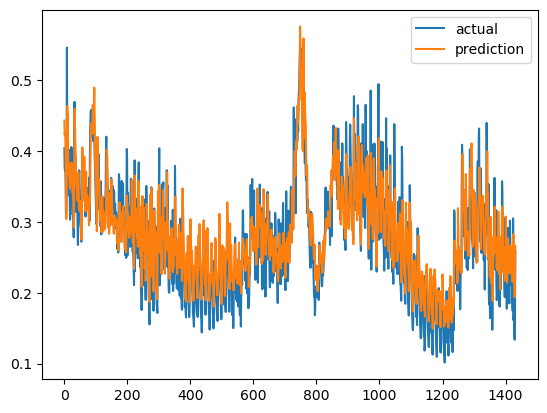

{'mae': 0    0.037931
dtype: float64, 'mape': 0    15.377548
dtype: float64, 'rmse': 0    0.047346
dtype: float64}


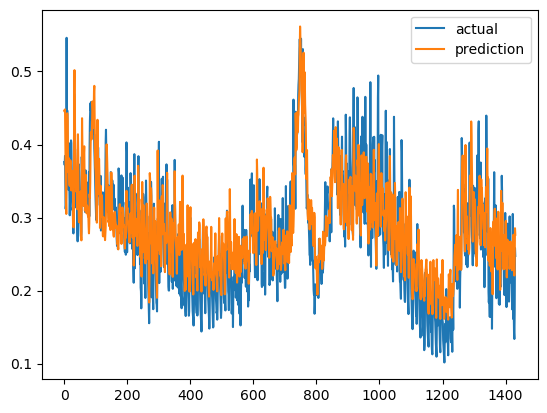

{'mae': 0    0.039661
dtype: float64, 'mape': 0    16.062848
dtype: float64, 'rmse': 0    0.049184
dtype: float64}


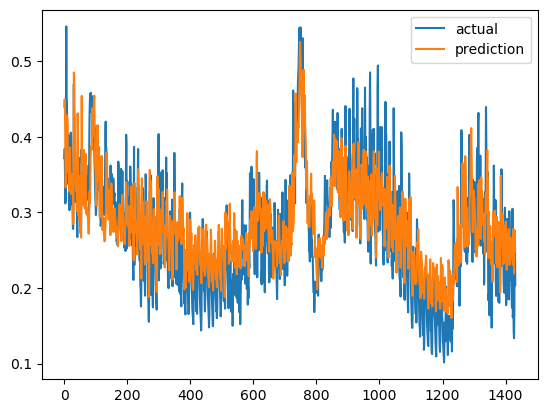

Epoch 1/1000
181/181 [==============================] - 19s 106ms/step - loss: 0.0092 - val_loss: 0.0143
Epoch 2/1000
181/181 [==============================] - 19s 103ms/step - loss: 0.0087 - val_loss: 0.0157
Epoch 3/1000
181/181 [==============================] - 18s 101ms/step - loss: 0.0087 - val_loss: 0.0171
Epoch 4/1000
181/181 [==============================] - 18s 101ms/step - loss: 0.0089 - val_loss: 0.0182
Epoch 5/1000
181/181 [==============================] - 19s 104ms/step - loss: 0.0092 - val_loss: 0.0189
Epoch 6/1000
181/181 [==============================] - 19s 103ms/step - loss: 0.0095 - val_loss: 0.0192
Epoch 7/1000
181/181 [==============================] - 19s 103ms/step - loss: 0.0097 - val_loss: 0.0193
Epoch 8/1000
181/181 [==============================] - 18s 101ms/step - loss: 0.0100 - val_loss: 0.0191
Epoch 9/1000
181/181 [==============================] - 18s 100ms/step - loss: 0.0103 - val_loss: 0.0187
Epoch 10/1000
181/181 [==============================] 

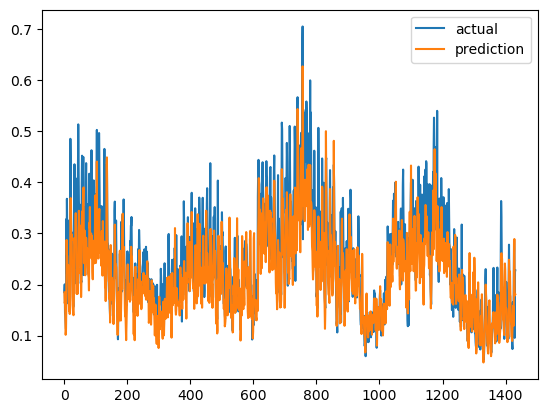

{'mae': 0    0.048225
dtype: float64, 'mape': 0    19.865734
dtype: float64, 'rmse': 0    0.065916
dtype: float64}


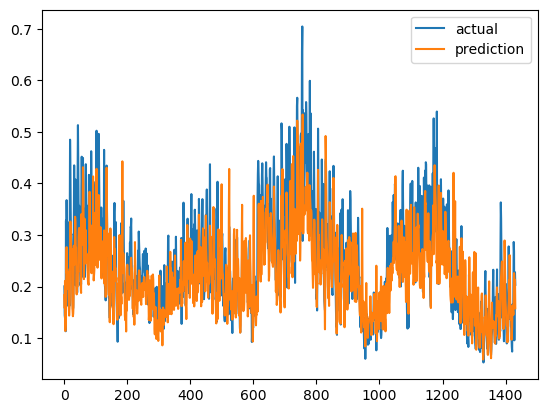

{'mae': 0    0.050235
dtype: float64, 'mape': 0    20.650031
dtype: float64, 'rmse': 0    0.067936
dtype: float64}


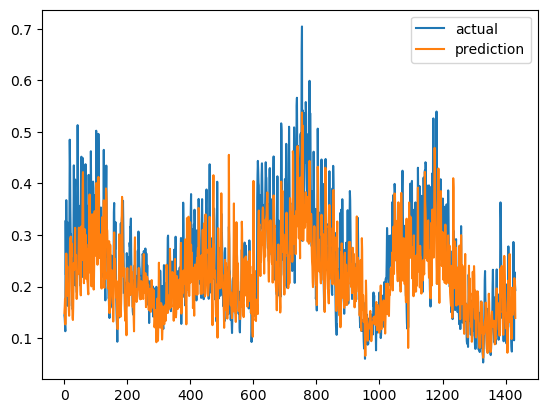

Epoch 1/1000
181/181 [==============================] - 19s 106ms/step - loss: 0.0091 - val_loss: 0.1802
Epoch 2/1000
181/181 [==============================] - 18s 102ms/step - loss: 0.0093 - val_loss: 0.1732
Epoch 3/1000
181/181 [==============================] - 18s 101ms/step - loss: 0.0096 - val_loss: 0.1683
Epoch 4/1000
181/181 [==============================] - 18s 102ms/step - loss: 0.0098 - val_loss: 0.1651
Epoch 5/1000
181/181 [==============================] - 19s 104ms/step - loss: 0.0101 - val_loss: 0.1631
Epoch 6/1000
181/181 [==============================] - 19s 103ms/step - loss: 0.0105 - val_loss: 0.1623
Epoch 7/1000
181/181 [==============================] - 19s 103ms/step - loss: 0.0108 - val_loss: 0.1624
Epoch 8/1000
181/181 [==============================] - 18s 101ms/step - loss: 0.0111 - val_loss: 0.1632
Epoch 9/1000
181/181 [==============================] - 19s 103ms/step - loss: 0.0115 - val_loss: 0.1644
Epoch 10/1000
181/181 [==============================] 

In [ ]:
# time_step = 20, ac = sigmoid
m = my_lstm(full_data[1], "se8760")
m.do_scaling()
m.do_Bi_Seq2()

Epoch 1/1000
181/181 [==============================] - 19s 105ms/step - loss: 0.0294 - val_loss: 0.0161
Epoch 2/1000
181/181 [==============================] - 19s 103ms/step - loss: 0.0070 - val_loss: 0.0122
Epoch 3/1000
181/181 [==============================] - 18s 101ms/step - loss: 0.0051 - val_loss: 0.0105
Epoch 4/1000
181/181 [==============================] - 18s 100ms/step - loss: 0.0053 - val_loss: 0.0083
Epoch 5/1000
181/181 [==============================] - 18s 98ms/step - loss: 9.7605 - val_loss: 0.0106
Epoch 6/1000
181/181 [==============================] - 19s 103ms/step - loss: 0.0061 - val_loss: 0.0060
Epoch 7/1000
181/181 [==============================] - 18s 101ms/step - loss: 0.0043 - val_loss: 0.0046
Epoch 8/1000
181/181 [==============================] - 18s 102ms/step - loss: 0.0042 - val_loss: 0.0031
Epoch 9/1000
181/181 [==============================] - 18s 101ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 10/1000
181/181 [==============================] -

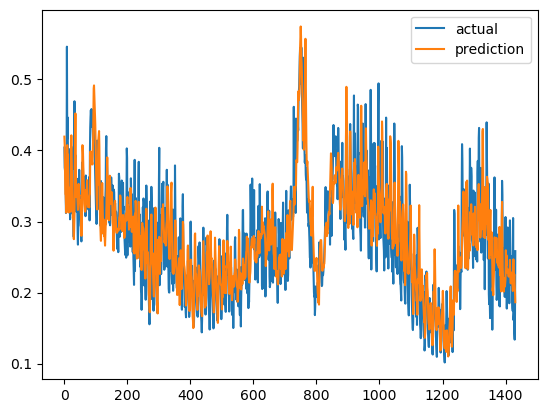

{'mae': 0    0.039323
dtype: float64, 'mape': 0    15.22121
dtype: float64, 'rmse': 0    0.050743
dtype: float64}


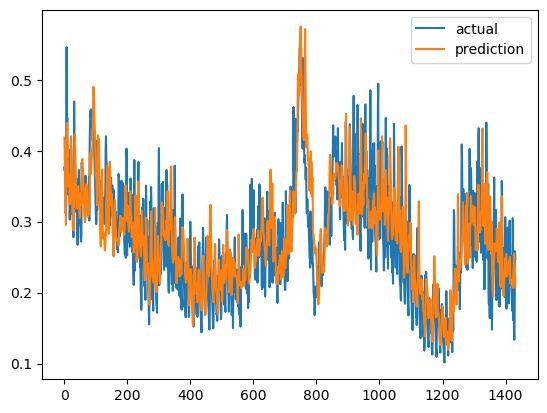

{'mae': 0    0.040068
dtype: float64, 'mape': 0    15.582749
dtype: float64, 'rmse': 0    0.051422
dtype: float64}


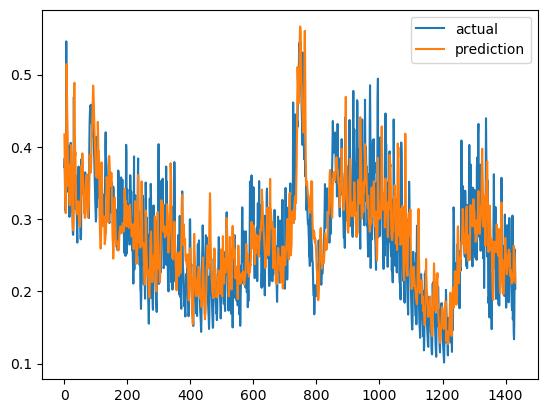

Epoch 1/1000
181/181 [==============================] - 19s 106ms/step - loss: 0.0171 - val_loss: 0.0121
Epoch 2/1000
181/181 [==============================] - 18s 101ms/step - loss: 0.0088 - val_loss: 0.0071
Epoch 3/1000
181/181 [==============================] - 19s 106ms/step - loss: 0.0585 - val_loss: 0.0071
Epoch 4/1000
181/181 [==============================] - 19s 103ms/step - loss: 0.0076 - val_loss: 0.0065
Epoch 5/1000
181/181 [==============================] - 19s 103ms/step - loss: 0.0067 - val_loss: 0.0059
Epoch 6/1000
181/181 [==============================] - 18s 102ms/step - loss: 0.0059 - val_loss: 0.0059
Epoch 7/1000
181/181 [==============================] - 18s 100ms/step - loss: 0.0054 - val_loss: 0.0058
Epoch 8/1000
181/181 [==============================] - 18s 102ms/step - loss: 0.0054 - val_loss: 0.0057
Epoch 9/1000
181/181 [==============================] - 18s 100ms/step - loss: 0.0051 - val_loss: 0.0056
Epoch 10/1000
181/181 [==============================] 

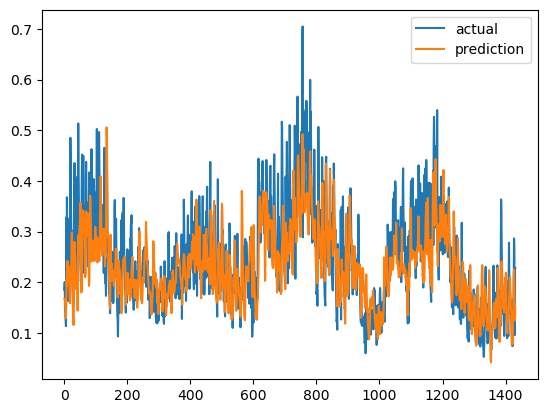

{'mae': 0    0.051564
dtype: float64, 'mape': 0    22.068216
dtype: float64, 'rmse': 0    0.069124
dtype: float64}


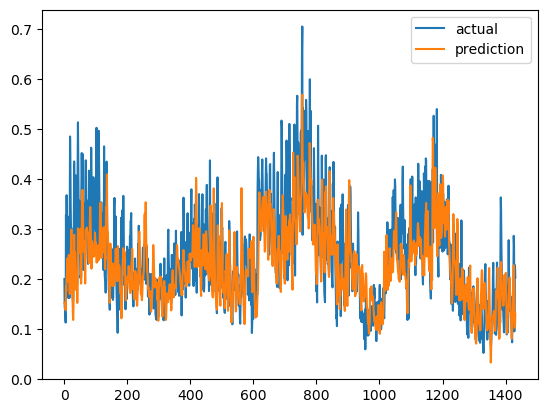

{'mae': 0    0.051724
dtype: float64, 'mape': 0    21.938304
dtype: float64, 'rmse': 0    0.069894
dtype: float64}


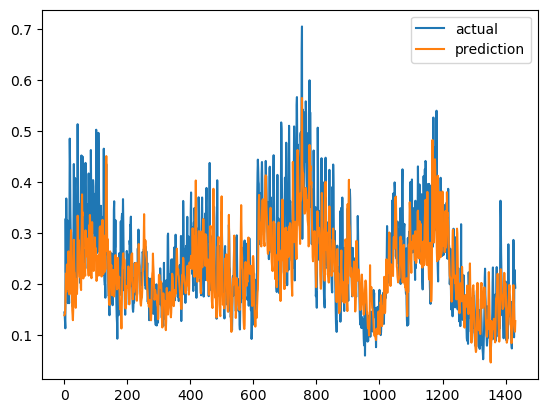

Epoch 1/1000
181/181 [==============================] - 19s 103ms/step - loss: 0.1784 - val_loss: 0.0994
Epoch 2/1000
181/181 [==============================] - 19s 103ms/step - loss: 0.0080 - val_loss: 0.0841
Epoch 3/1000
181/181 [==============================] - 19s 105ms/step - loss: 0.0063 - val_loss: 0.0983
Epoch 4/1000
181/181 [==============================] - 19s 103ms/step - loss: 0.0059 - val_loss: 0.0746
Epoch 5/1000
181/181 [==============================] - 19s 105ms/step - loss: 0.0055 - val_loss: 0.0741
Epoch 6/1000
181/181 [==============================] - 19s 105ms/step - loss: 0.0056 - val_loss: 0.0783
Epoch 7/1000
181/181 [==============================] - 19s 107ms/step - loss: 0.0051 - val_loss: 0.0766
Epoch 8/1000
181/181 [==============================] - 19s 104ms/step - loss: 0.0049 - val_loss: 0.0738
Epoch 9/1000
181/181 [==============================] - 19s 106ms/step - loss: 0.0048 - val_loss: 0.0775
Epoch 10/1000
181/181 [==============================] 

In [ ]:
# time_step = 20일 때의 결과
m = my_lstm(full_data[1], "se8760")
m.do_scaling()
m.do_Bi_Seq2()

Epoch 1/1000
182/182 [==============================] - 12s 67ms/step - loss: 0.0168 - val_loss: 0.0052
Epoch 2/1000
182/182 [==============================] - 11s 60ms/step - loss: 0.0075 - val_loss: 0.0034
Epoch 3/1000
182/182 [==============================] - 11s 63ms/step - loss: 0.0050 - val_loss: 0.0030
Epoch 4/1000
182/182 [==============================] - 12s 65ms/step - loss: 0.0042 - val_loss: 0.0028
Epoch 5/1000
182/182 [==============================] - 12s 64ms/step - loss: 0.0038 - val_loss: 0.0026
Epoch 6/1000
182/182 [==============================] - 12s 65ms/step - loss: 0.0037 - val_loss: 0.0026
Epoch 7/1000
182/182 [==============================] - 12s 67ms/step - loss: 0.0036 - val_loss: 0.0026
Epoch 8/1000
182/182 [==============================] - 12s 64ms/step - loss: 0.0035 - val_loss: 0.0025
Epoch 9/1000
182/182 [==============================] - 12s 63ms/step - loss: 0.0034 - val_loss: 0.0025
Epoch 10/1000
182/182 [==============================] - 12s 65m

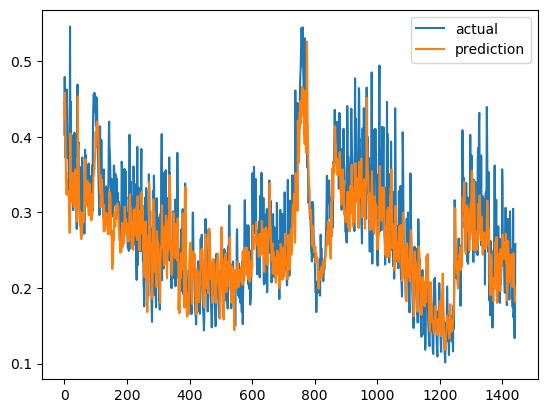

{'mae': 0    0.0415
dtype: float64, 'mape': 0    15.186635
dtype: float64, 'rmse': 0    0.054548
dtype: float64}


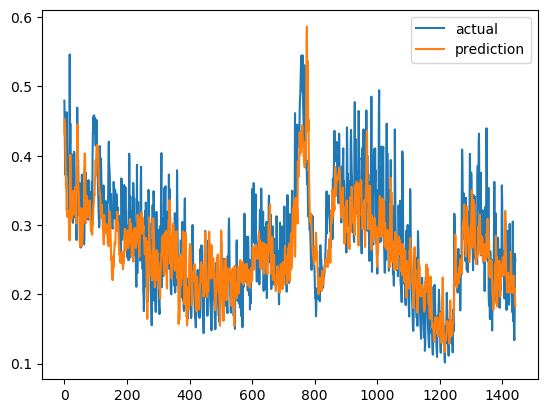

{'mae': 0    0.044575
dtype: float64, 'mape': 0    16.501035
dtype: float64, 'rmse': 0    0.05824
dtype: float64}


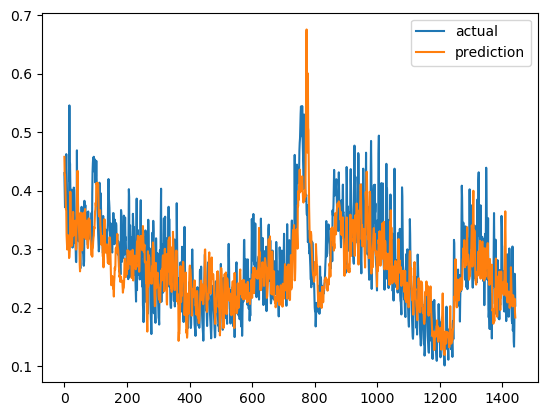

Epoch 1/1000
182/182 [==============================] - 12s 68ms/step - loss: 0.0235 - val_loss: 0.0131
Epoch 2/1000
182/182 [==============================] - 12s 64ms/step - loss: 0.0091 - val_loss: 0.0076
Epoch 3/1000
182/182 [==============================] - 11s 60ms/step - loss: 0.0067 - val_loss: 0.0068
Epoch 4/1000
182/182 [==============================] - 11s 58ms/step - loss: 0.0095 - val_loss: 0.0068
Epoch 5/1000
182/182 [==============================] - 10s 57ms/step - loss: 0.0188 - val_loss: 0.0070
Epoch 6/1000
182/182 [==============================] - 11s 59ms/step - loss: 0.0069 - val_loss: 0.0059
Epoch 7/1000
182/182 [==============================] - 11s 60ms/step - loss: 0.0074 - val_loss: 0.0057
Epoch 8/1000
182/182 [==============================] - 11s 61ms/step - loss: 0.0061 - val_loss: 0.0053
Epoch 9/1000
182/182 [==============================] - 11s 62ms/step - loss: 0.0056 - val_loss: 0.0051
Epoch 10/1000
182/182 [==============================] - 11s 61m

KeyboardInterrupt: 

In [67]:
# time_step = 10일 때의 결과
m = my_lstm(full_data[1], "se8760")
m.do_scaling()
m.do_Bi_Seq2()

In [16]:
from pyFTS.common import Transformations, Util as cUtil, Membership as mf
from pyFTS.benchmarks import benchmarks as bchmk, Util as bUtil, Measures
from pyFTS.partitioners import CMeans, Grid, FCM, Huarng, Entropy, Util as pUtil
from pyFTS.models.multivariate import common, variable, mvfts


from pyFTS.models import hofts
from pyFTS.models import chen

In [21]:
class my_anfis():
    def __init__(self, df):
        self.dataset = df
        self.df = []
        
    def make_dataset(self):
        df = self.dataset
        
        for split in df:
            train_data = pd.concat([split[0], split[1]], axis = 1)
            valid_data = pd.concat([split[2], split[3]], axis = 1)
            split_data = pd.concat([train_data, valid_data]).reset_index()
            self.df.append(split_data)
    
    def ANFIS_model(self, num, unique_name = "default_data"):
        df = self.df[num]
        print(df)
        print("Formatting the Dataset")
        tested_data = []
        num_cols = len(df.columns) - 1
        for i in range(1, num_cols + 1):
            tested_data.append(df.iloc[:,i].to_numpy())

        tdiff = Transformations.Differential(1)

        dataset_names = ["pca%d"%i for i in range(1, num_cols)]
        dataset_names.append("waterlvl")

        print("Data Partitioning... on progess")

        partitioners = {}
        partitioners_diff = {}
        # fig, ax = plt.subplots(nrows=num_cols//3*2, ncols=3, figsize=[20,5])


        for count, dataset_name in enumerate(dataset_names):
            print(count ,end = " ")
            dataset = tested_data[count]

            partitioner = CMeans.CMeansPartitioner(data = dataset, npart=12)
            partitioners[dataset_name] = partitioner

            partitioner_diff = CMeans.CMeansPartitioner(data = dataset, npart=12, transformation = tdiff)
            partitioners_diff[dataset_name] = partitioner_diff

            # pUtil.plot_sets(dataset, [partitioner.sets], titles=[dataset_name], axis = ax[count//3][count%3])
            # pUtil.plot_sets(dataset, [partitioner_diff.sets], titles=[''], axis = ax[count//3 + num_cols//3][count%3])

        print("\n")

        print("Modeling... on progress")

        train_split = 4996

        for count, dataset_name in enumerate(dataset_names):
            print(count, end = " ")
            dataset = tested_data[count]

            for order in [2]:

                model2 = hofts.HighOrderFTS(partitioner = partitioners_diff[dataset_name], order = order)
                model2.name = dataset_name + str(order)
                model2.append_transformation(tdiff)
                model2.fit(dataset[:train_split], save_model=True, file_path=f'./data_ANFIS/{unique_name}_diff_'+dataset_name+str(order))

        print("\n")

        print("Predicting and Visualizing... on progress")

        fig, ax = plt.subplots(nrows=num_cols*2, ncols=1, figsize=[20,15])

        for count, dataset_name in enumerate(dataset_names):
            print(count, end = " ")
            dataset = tested_data[count]

            for order in [2]:
                orig_data = dataset[train_split:train_split+1240]
                ax[count*2].plot(orig_data)

                model2 = cUtil.load_obj(f'./data_ANFIS/{unique_name}_diff_'+dataset_name+str(order))
                forecasts = model2.predict(dataset[train_split:train_split+1240])
                # print(forecasts)

                ax[count*2].plot(forecasts)
                ax[count*2].set_title(unique_name + '_' + dataset_name)


                # print("orig_data:", orig_data)
                # print("pred_data:", forecasts)
                diff_data_list = []
                for i in range(len(forecasts)):
                    orig = orig_data[i]
                    pred = forecasts[i]
                    diff_data_list.append(orig - pred)
                diff_data = pd.DataFrame({"error": diff_data_list})
                ax[count*2+1].plot(diff_data)

        plt.tight_layout()

        print("\n")
        print("Evaluating the Model... on progress")

        rows = []

        for count,dataset_name in enumerate(dataset_names):
            print(count, end = " ")

            dataset = tested_data[count]

            for order in [2]:

                row = [order, dataset_name]
                test = dataset[train_split:train_split+1240]

                model1 = cUtil.load_obj(f'./data_ANFIS/{unique_name}_diff_'+dataset_name+str(order))
                row.extend(Measures.get_point_statistics(test, model1))
                rows.append(row)

        print("\n")
        print(pd.DataFrame(rows,columns=["Order", "Dataset","RMSE","SMAPE","Theil's U"]))

        return            

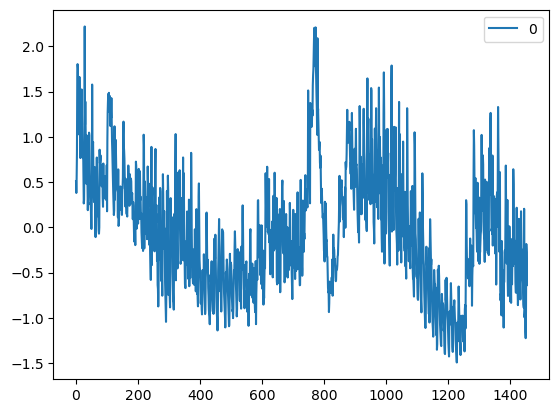

In [20]:
full_data[1][0][3].plot()

      index      pca1      pca2      pca3      pca4         0
0         0  0.208383 -0.425257 -0.477996 -0.459498 -0.596431
1         1  0.201063 -0.656708 -0.507143 -0.410752 -0.525898
2         2  0.611105 -0.785532 -0.770622 -0.235706 -0.763697
3         3  0.603403 -1.090502 -0.737862 -0.535567 -0.953061
4         4  0.620431 -1.295051 -0.744812 -0.878271 -1.418941
...     ...       ...       ...       ...       ...       ...
7262   1449 -0.535160 -1.139137  0.087961  1.187245  0.198084
7263   1450 -0.554040 -1.358873 -0.039177  1.837821  0.024342
7264   1451 -0.064164 -1.589636 -0.108355  1.050533 -0.492122
7265   1452 -0.427015 -2.108492  0.041261  1.199033 -0.440228
7266   1453 -0.096738 -2.181112 -0.167908  1.315300 -0.208362

[7267 rows x 6 columns]
Formatting the Dataset
Data Partitioning... on progess
0 1 2 3 4 

Modeling... on progress
0 1 2 3 4 

Predicting and Visualizing... on progress
0 1 2 3 4 

Evaluating the Model... on progress
0 1 2 3 4 

   Order   Dataset  RMSE  

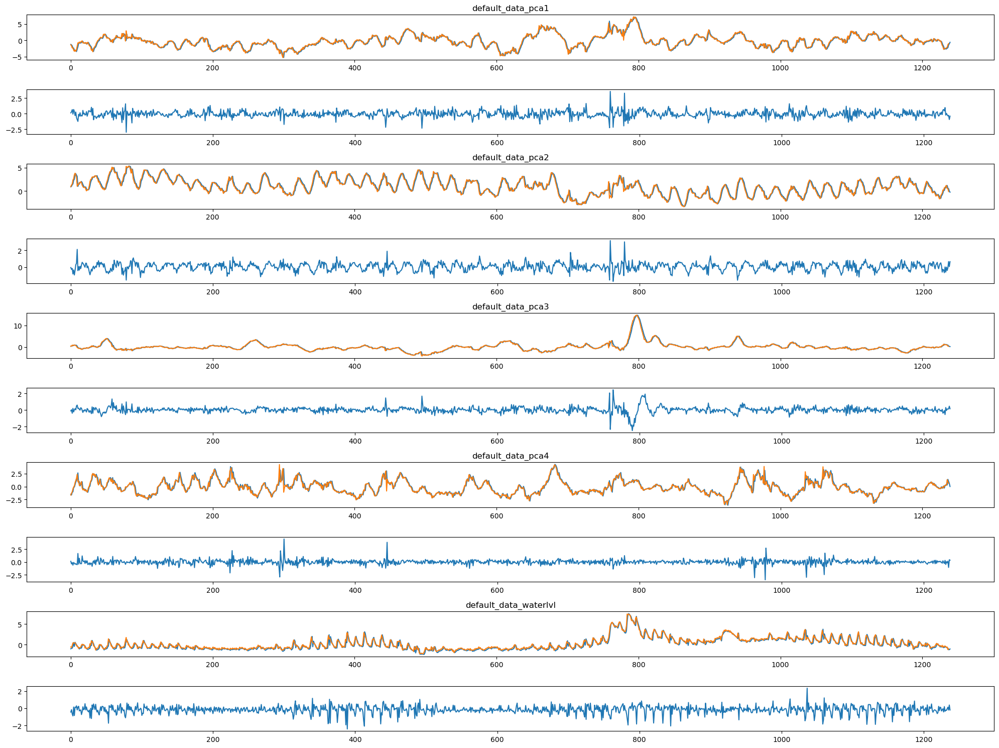

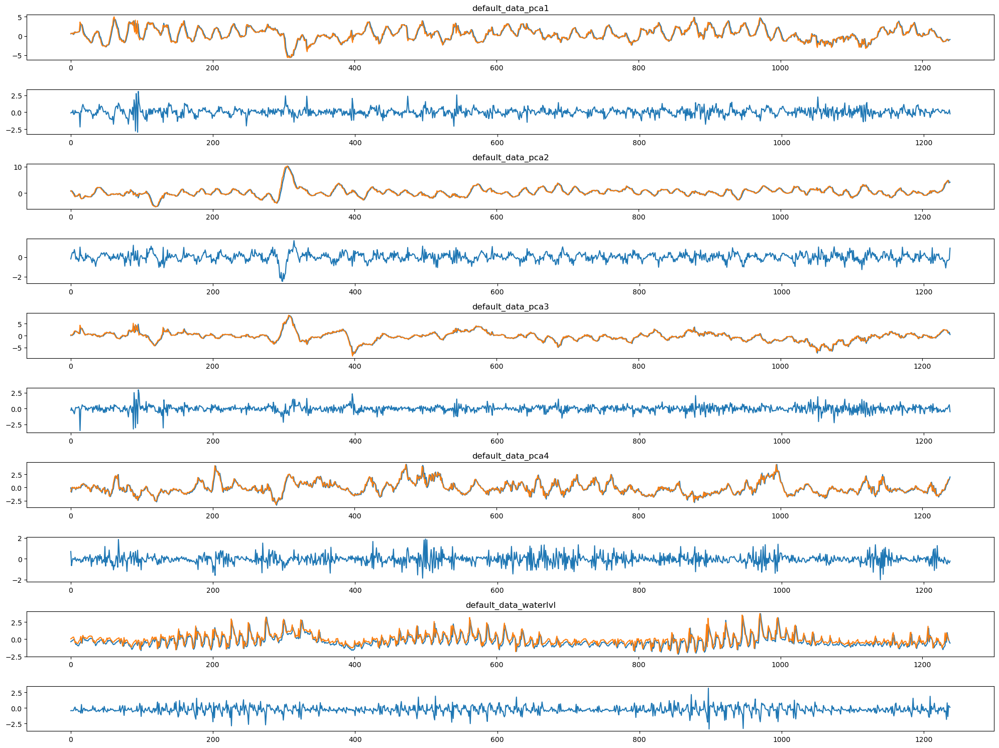

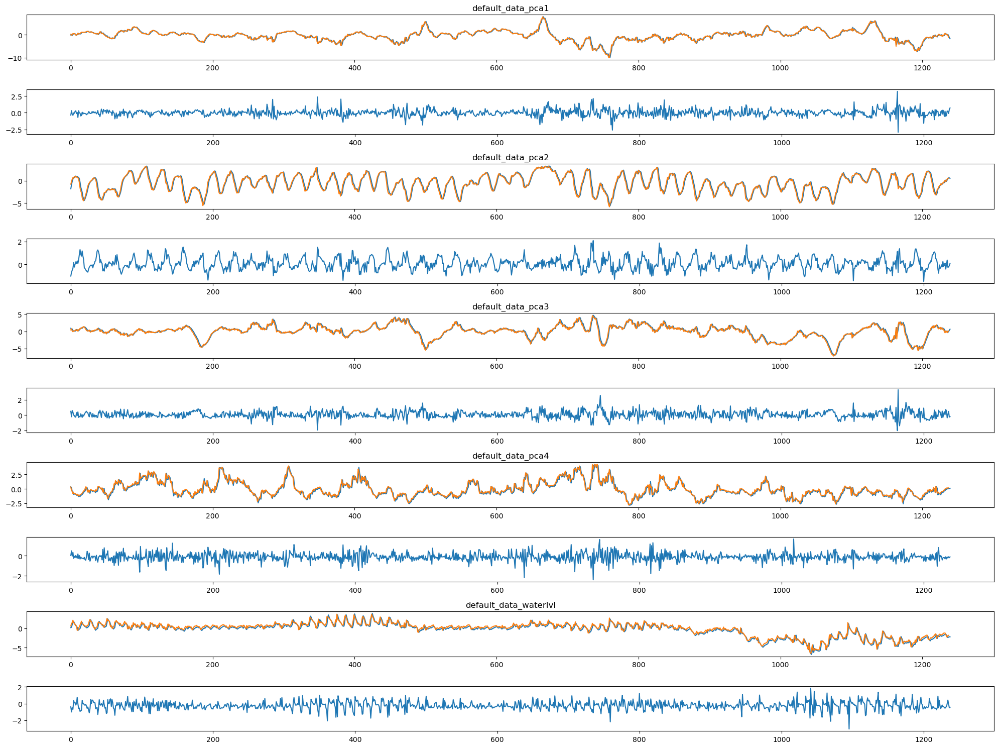

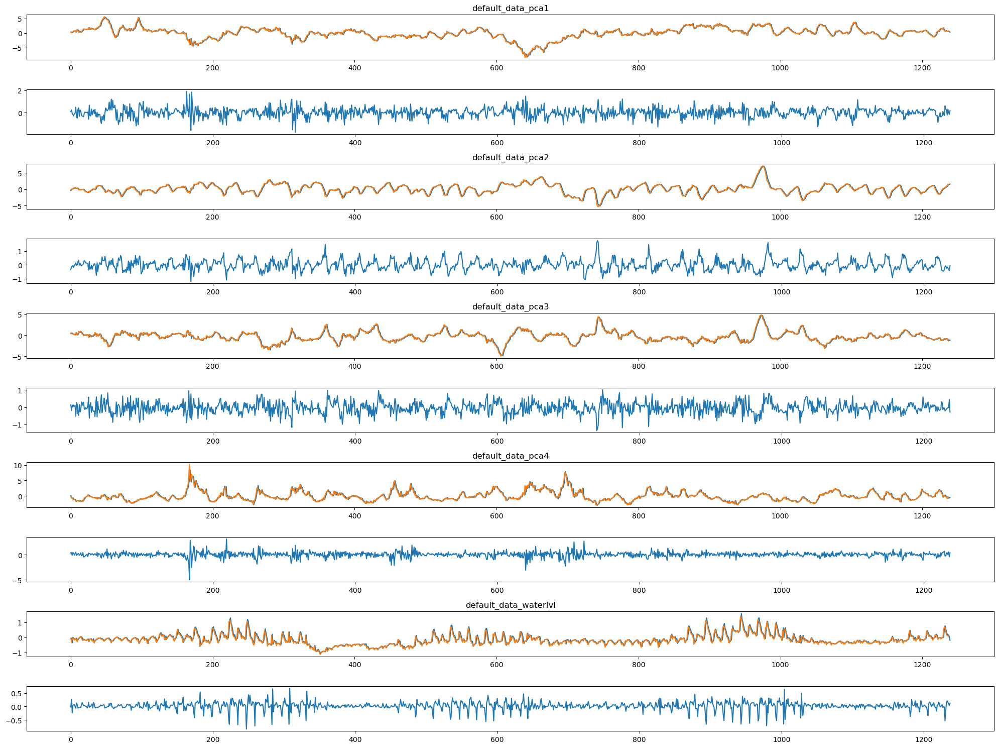

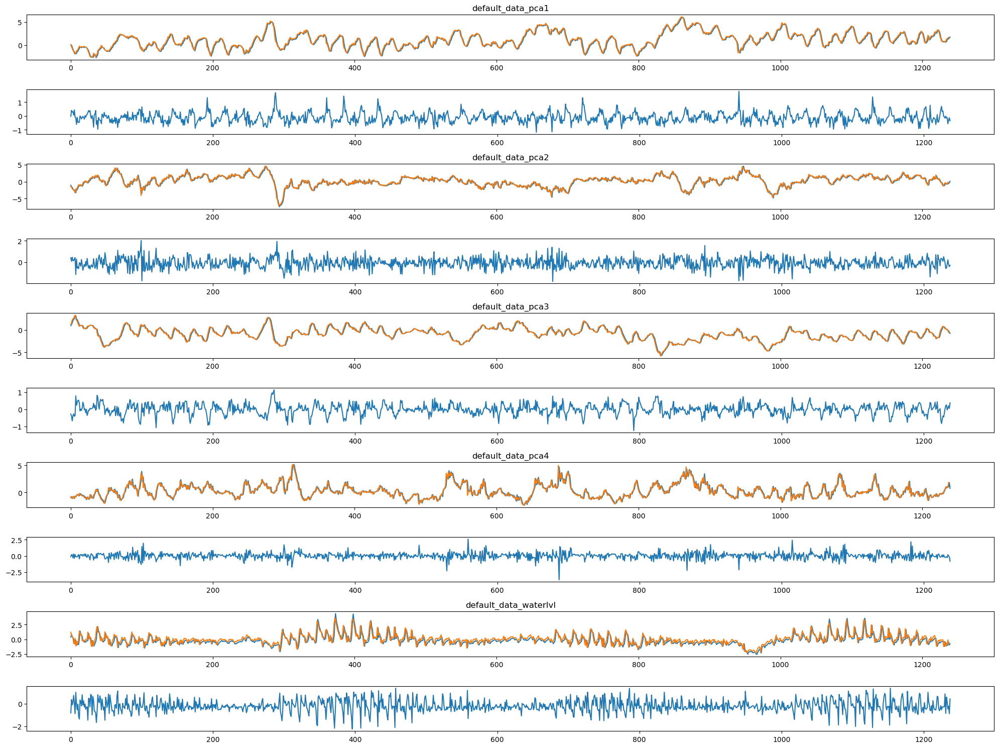

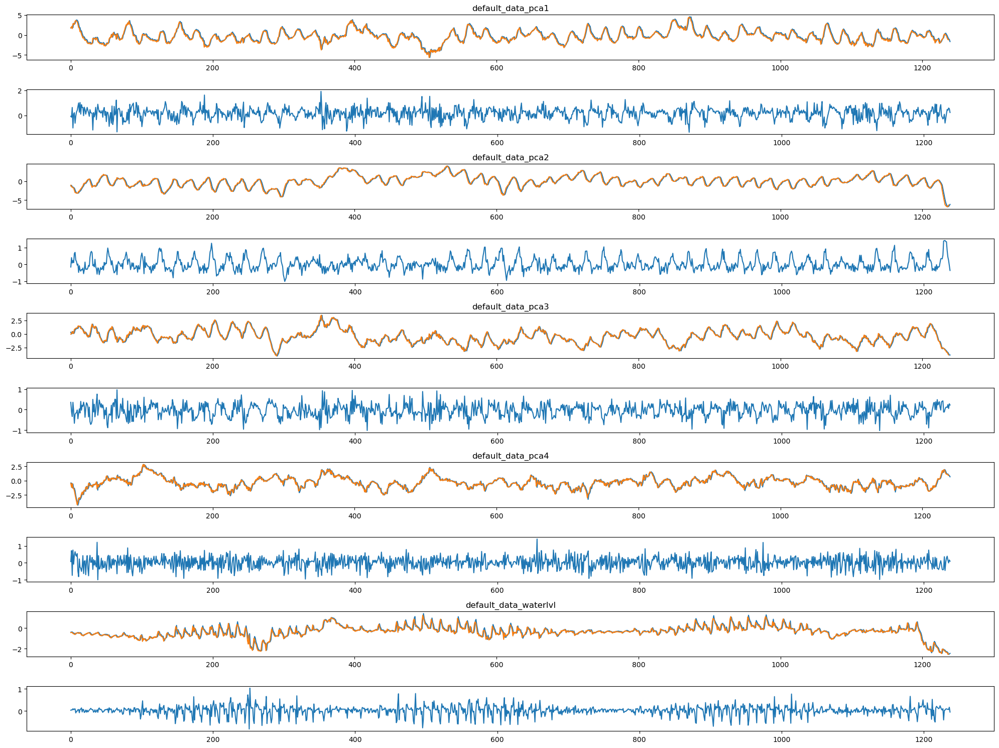

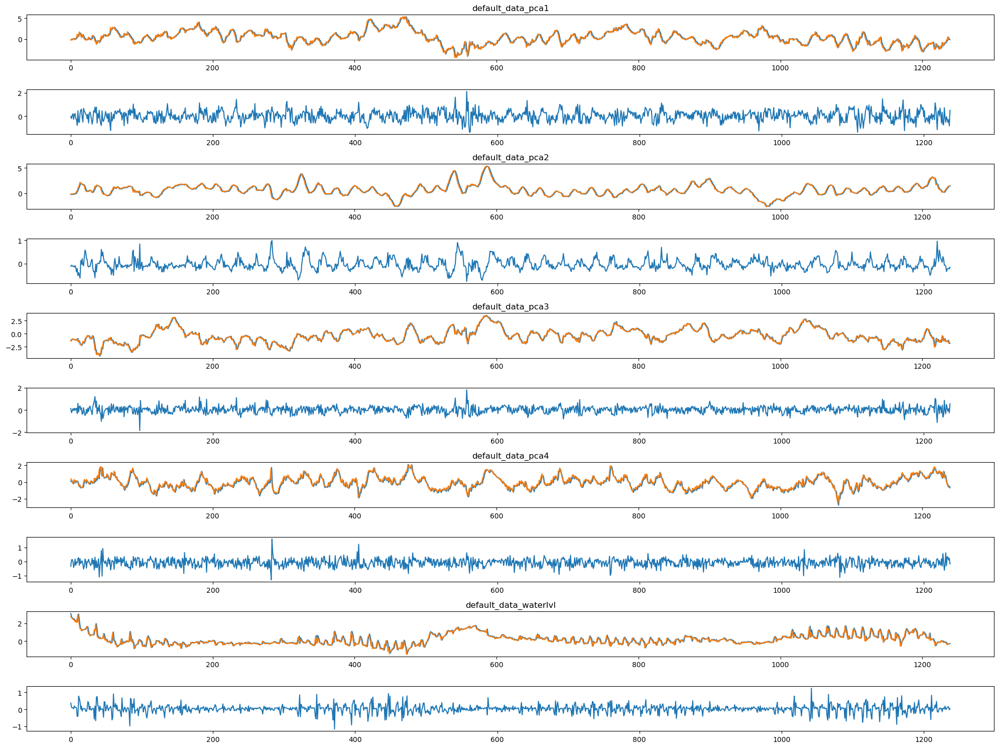

In [22]:
a = my_anfis(full_data[2])
a.make_dataset()
for i in range(7):
    a.ANFIS_model(i)

      index      pca1      pca2      pca3      pca4         0
0         0 -2.168666  3.636957  0.311336 -0.294630  1.582407
1         1 -2.462955  3.620142  0.501964 -0.317032  1.368518
2         2 -2.233932  4.079028  0.081769 -0.303087  1.609138
3         3 -2.745377  3.909882  0.526935 -0.106340  1.898013
4         4 -2.673152  3.870080  0.522376  0.099730  2.629851
...     ...       ...       ...       ...       ...       ...
7262   1449  0.011116  0.386071 -1.239644 -0.220630 -1.224670
7263   1450 -0.214403  0.642748 -1.344701 -0.299778 -0.917509
7264   1451 -0.573206  0.547378 -1.016375 -0.556418 -0.184306
7265   1452  0.218056  0.864171 -1.814302 -0.192347 -0.274956
7266   1453 -0.362176  0.829722 -1.458964 -0.253475 -0.638359

[7267 rows x 6 columns]
Formatting the Dataset
Data Partitioning... on progess
0 1 2 3 4 

Modeling... on progress
0 1 2 3 4 

Predicting and Visualizing... on progress
0 1 2 3 4 

Evaluating the Model... on progress
0 1 2 3 4 

   Order   Dataset  RMSE  

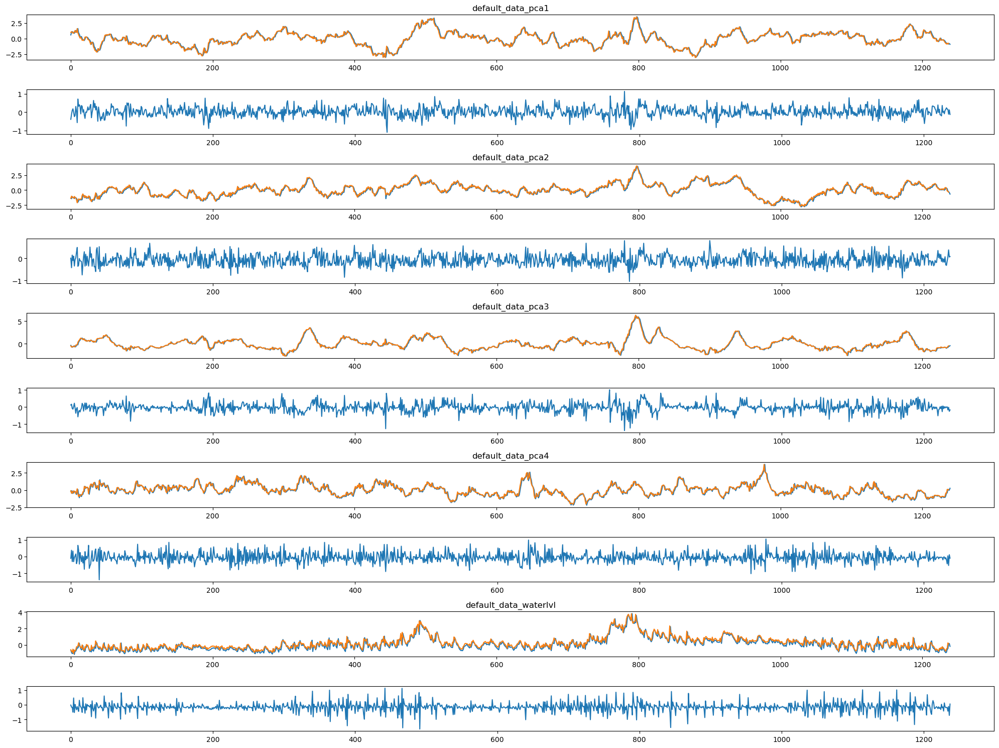

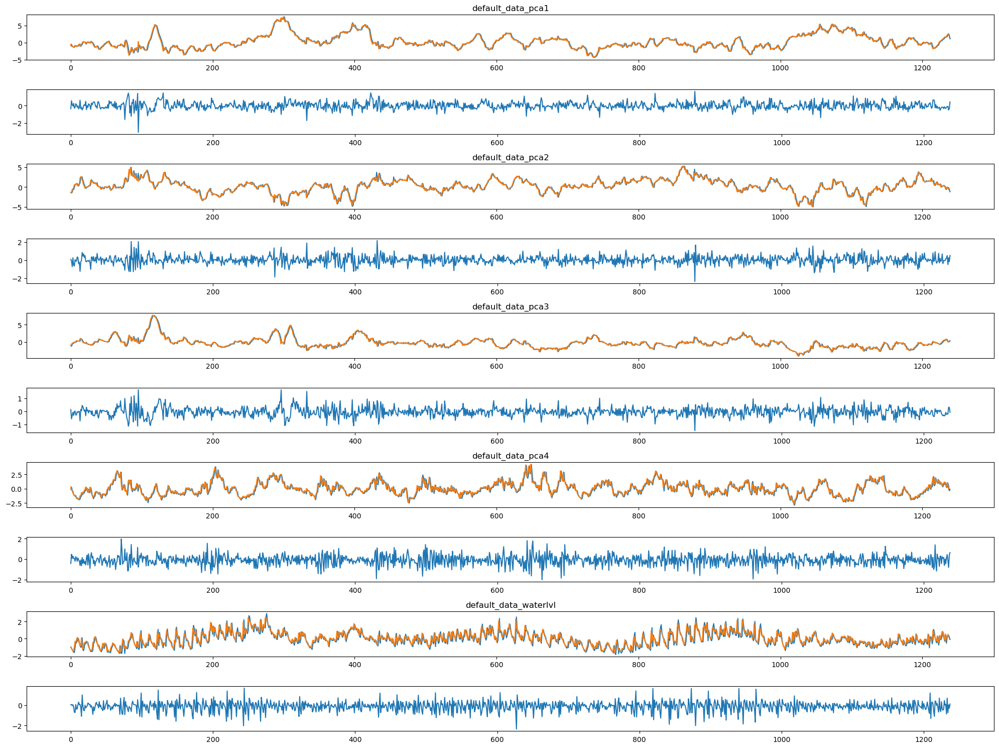

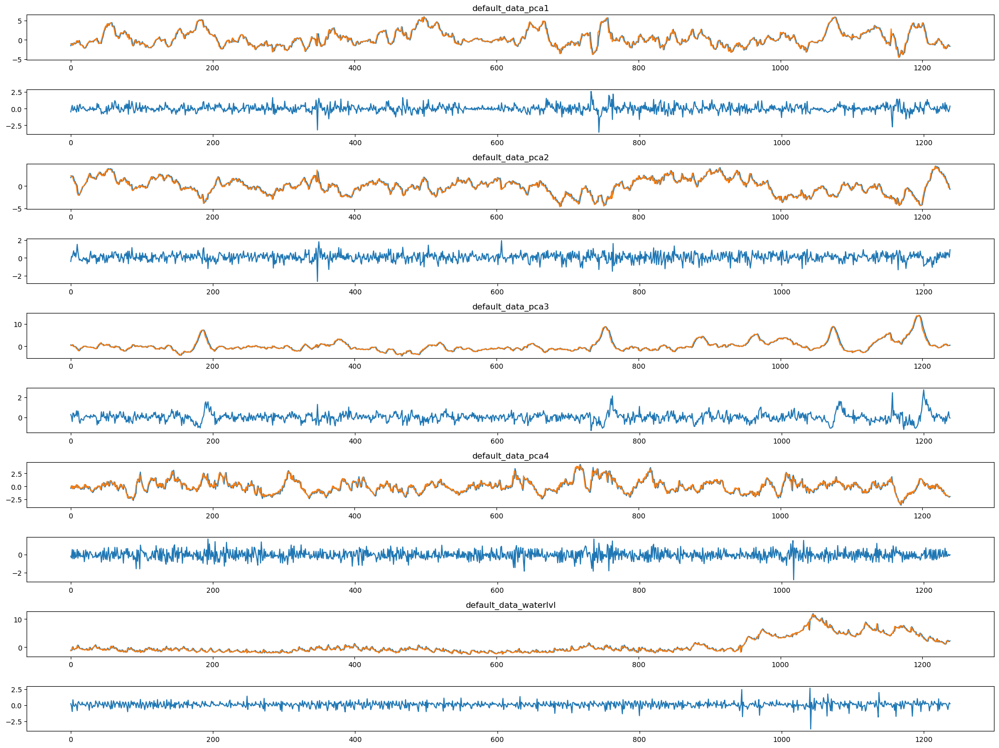

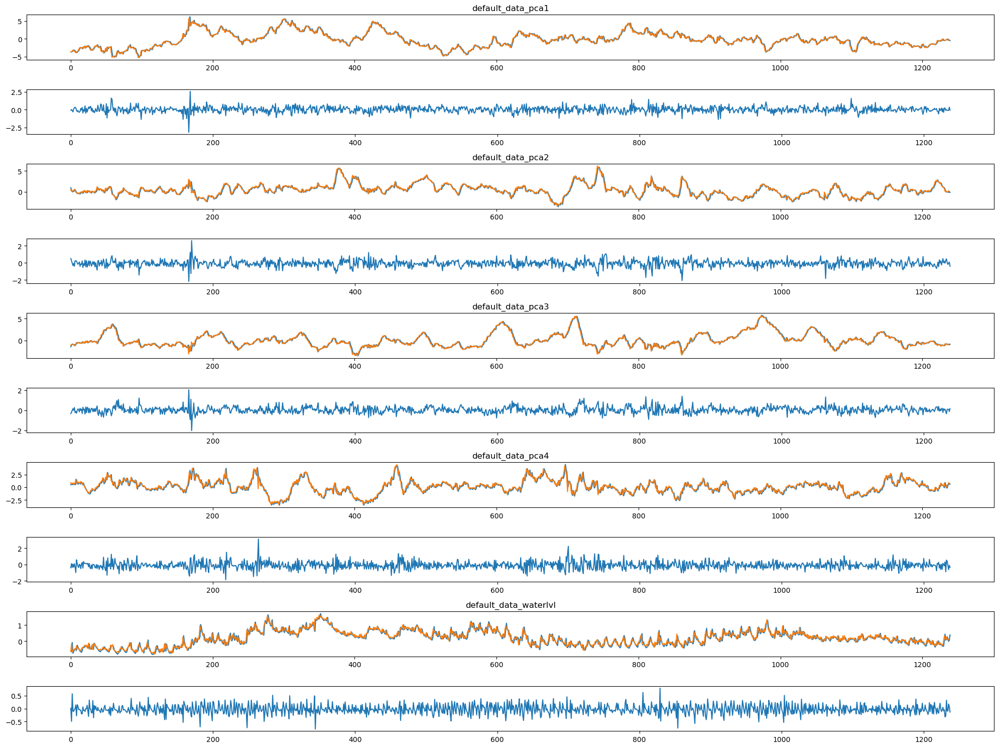

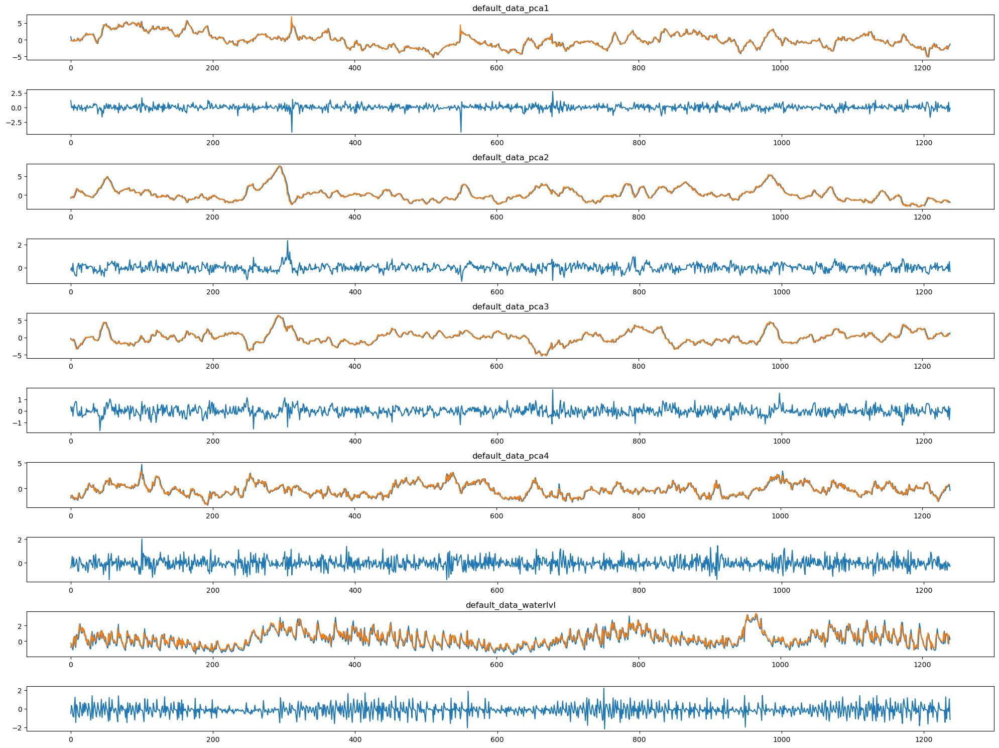

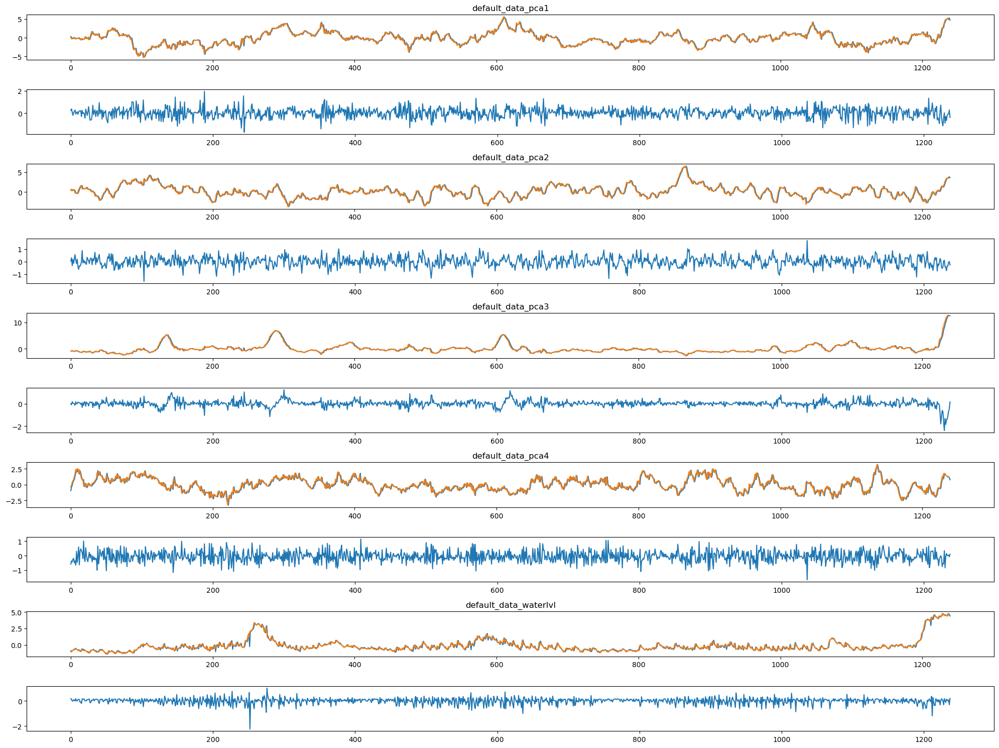

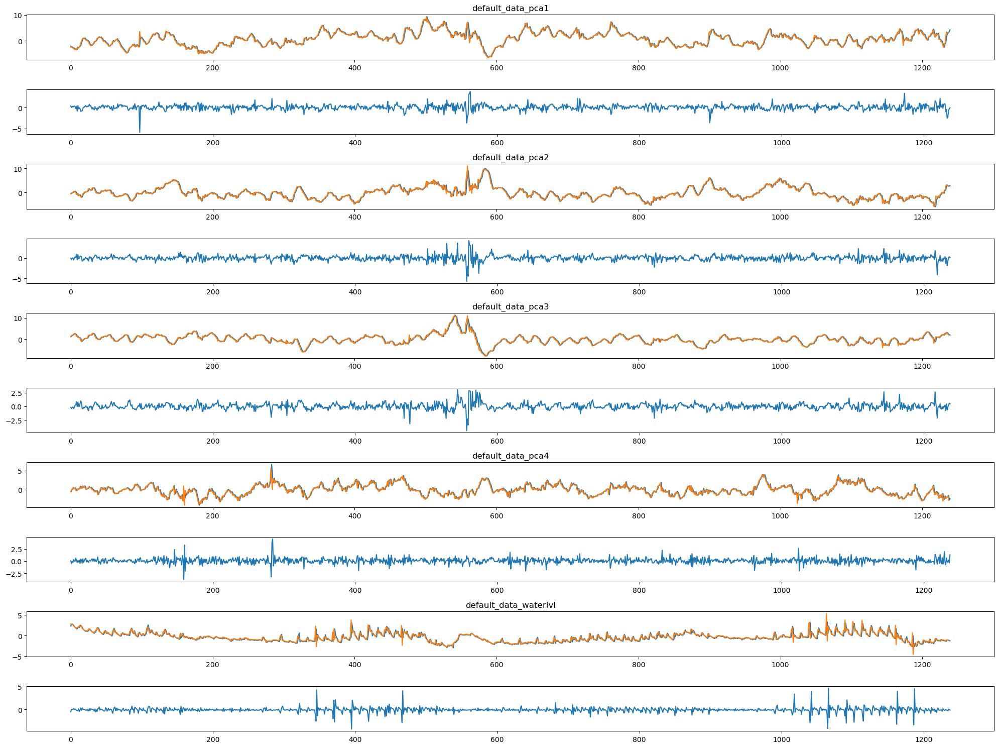

In [25]:
a = my_anfis(full_data[1])
a.make_dataset()
for i in range(7):
    a.ANFIS_model(i)

In [55]:
a = my_anfis(full_data[2])
a.make_dataset()

In [ ]:
for i in range(7):
    a.ANFIS_model(i)

      index      pca1      pca2      pca3      pca4         0
0         0  0.208383 -0.425257 -0.477996 -0.459498 -0.596431
1         1  0.201063 -0.656708 -0.507143 -0.410752 -0.525898
2         2  0.611105 -0.785532 -0.770622 -0.235706 -0.763697
3         3  0.603403 -1.090502 -0.737862 -0.535567 -0.953061
4         4  0.620431 -1.295051 -0.744812 -0.878271 -1.418941
...     ...       ...       ...       ...       ...       ...
7262   1449 -0.535160 -1.139137  0.087961  1.187245  0.198084
7263   1450 -0.554040 -1.358873 -0.039177  1.837821  0.024342
7264   1451 -0.064164 -1.589636 -0.108355  1.050533 -0.492122
7265   1452 -0.427015 -2.108492  0.041261  1.199033 -0.440228
7266   1453 -0.096738 -2.181112 -0.167908  1.315300 -0.208362

[7267 rows x 6 columns]
Formatting the Dataset
Data Partitioning... on progess
0 1 

In [125]:
a.df = []

for split in full_data[2]:
    print(split)
    train_data = pd.concat([split[0], split[1]], axis = 1)
    valid_data = pd.concat([split[2], split[3]], axis = 1)
    split_data = pd.concat([train_data, valid_data]).reset_index()
a.df.append(split_data)
        #print(split[0])
    #a.df.append(comp_data)
print(a.df[0])
#print(pd.DataFrame(train_data))

[          pca1      pca2      pca3      pca4
0     0.208383 -0.425257 -0.477996 -0.459498
1     0.201063 -0.656708 -0.507143 -0.410752
2     0.611105 -0.785532 -0.770622 -0.235706
3     0.603403 -1.090502 -0.737862 -0.535567
4     0.620431 -1.295051 -0.744812 -0.878271
...        ...       ...       ...       ...
5808 -0.558525 -0.780474  2.362831 -0.427484
5809 -0.654958 -1.059462  2.226185 -0.378340
5810 -0.816373 -1.469881  2.234788 -0.287981
5811 -0.512045 -1.455732  2.204705 -0.314751
5812 -0.506441 -1.489622  2.523337 -0.527889

[5813 rows x 4 columns],              0
0    -0.596431
1    -0.525898
2    -0.763697
3    -0.953061
4    -1.418941
...        ...
5808  2.928002
5809  2.471004
5810  2.114025
5811  1.594591
5812  1.425924

[5813 rows x 1 columns],           pca1      pca2      pca3      pca4
0    -0.009295 -1.115876  2.533420 -0.414437
1     0.177364 -0.793664  2.766990 -0.345472
2    -0.216928 -0.779282  3.440998 -0.297193
3    -0.692361 -0.409769  4.022217 -0.074962
4 

In [ ]:
class model():
    def __init__(self, df):
        self.full_data = df
    
    def full_model(self):
        #self.tr_result = self.my_var(self.full_data[0])
        self.se24_result = self.my_mstl(self.full_data)
        
    
    
#     def my_var_eval(self, df): # for trend
        
#         given_data = df
#         lag = 15
#         step = 3
#         size = 30

#         for block_data in given_data:
#             X_train = block_data[0]
#             y_train = block_data[1]
#             X_valid = block_data[2]
#             y_valid = block_data[3]
#             SMAPE_sum = 0
#             RMSE_sum = 0
#             df_train = pd.merge(y_train, X_train, left_index=True, right_index=True, how='inner')
#             df_valid = pd.merge(y_valid, X_valid, left_index=True, right_index=True, how='inner')

#             self.var_model = VAR(df_train)
#             results = self.var_model.fit(lag)

#             df_valid = pd.concat([df_train.loc[-lag: , :], df_valid])

#             for i in range(0, len(df_valid)-lag):
#                 lagged_values = df_valid.values[i: i+lag]
#                 forecast = pd.DataFrame(results.forecast(y = lagged_values, steps = step), columns=df_train.columns)
#                 SMAPE_sum += SMAPE(forecast.iloc[:step, [0]], df_valid.iloc[i+1: i+step+1, [0]])
#                 RMSE_sum += RMSE(forecast.iloc[:step, [0]], df_valid.iloc[i+1: i+step+1, [0]]) 
#             print(f"SMAPE avg {SMAPE_sum / (len(df_valid) - lag)}, RMSE avg {RMSE_sum / (len(df_valid) - lag)}")
    
#     def my_var_pred(self):

    def my_lstm(self, df):
        
        

In [ ]:
# 실제로 사용할 것.
class model():
    def __init__(self, df):
        self.full_data = df
    
    def full_model(self):
        self.tr_result = self.my_var(self.full_data[0])
    
    def my_var(self, df): # for trend
        
        given_data = df
        lag = 15
        step = 3
        size = 30

        for block_data in given_data:
            X_train = block_data[0]
            y_train = block_data[1]
            X_valid = block_data[2]
            y_valid = block_data[3]
            SMAPE_sum = 0
            RMSE_sum = 0
            df_train = pd.merge(y_train, X_train, left_index=True, right_index=True, how='inner')
            df_valid = pd.merge(y_valid, X_valid, left_index=True, right_index=True, how='inner')

            self.var_model = VAR(df_train)
            results = self.var_model.fit(lag)

            df_valid = pd.concat([df_train.loc[-lag: , :], df_valid])

            for i in range(0, len(df_valid)-lag):
                lagged_values = df_valid.values[i: i+lag]
                forecast = pd.DataFrame(results.forecast(y = lagged_values, steps = step), columns=df_train.columns)
                SMAPE_sum += SMAPE(forecast.iloc[:step, [0]], df_valid.iloc[i+1: i+step+1, [0]])
                RMSE_sum += RMSE(forecast.iloc[:step, [0]], df_valid.iloc[i+1: i+step+1, [0]]) 
            print(f"SMAPE avg {SMAPE_sum / (len(df_valid) - lag)}, RMSE avg {RMSE_sum / (len(df_valid) - lag)}")
        